# PP_004: HEALTH INSURANCE CROSS SELL

## Ciclo 00 - Planning - IOT Method

## Ciclo 1.0 -

## Ciclo 2.0 -

## Ciclo 3.0 -

## Ciclo 4.0 -

## Ciclo 5.0 -

## Ciclo 6.0 -

## Ciclo 7.0 -

## Ciclo 8.0 -

## Ciclo 9.0 -

## Ciclo 10.0 -

# Solution Planning (IOT)

### INPUT (ENTRADA)

1. **PROBLEMA DE NEGÓCIO**
    - A Insurance All deseja selecionar os clientes mais propensos a aceitar a oferta de um novo produto, um seguro de automóvel.
    
    
2. **CONJUNTO DE DADOS**
    - A empresa fez uma pesquisa com cerca de 380 mil clientes sobre o interesse em aderir a um novo produto de seguro de automóveis, no ano passado. Todos os clientes demonstraram interesse ou não em adquirir o seguro de automóvel e essas respostas ficaram salvas em um banco de dados junto com outros atributos dos clientes.

### OUTPUT (SAÍDA)

1. **LISTA DE CLIENTES**
 - Uma lista com a indicação das n_ésimas primeiras pessoas que serão contactadas pelo time de vendas.
    
    
2. **RELATÓRIO DE RESPOSTAS**
 - Um relatório contendo as respostas para as seguintes perguntas de negócio:
    - *Principais Insights sobre os atributos mais relevantes de clientes interessados em adquirir um seguro de automóvel.*
    - *Qual a porcentagem de clientes interessados no novo produto que o time de vendas conseguirá contatar fazendo 20.000 ligações?*
    - *E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados o time de vendas conseguirá contatar?*
    - *Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados no novo produto?*

### TASKS (TAREFAS)

***1. Principais Insights sobre os atributos mais relevantes de clientes interessados em adquirir um seguro de automóvel.***
 - Calcular 

            
***2. Qual a porcentagem de clientes interessados no novo produto que o time de vendas conseguirá contatar fazendo 20.000 ligações?***
  - Calcular 
    
    
***3. E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados o time de vendas conseguirá contatar?***
  - Calcular  
    
    
***4. Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados no novo produto?***
  - Calcular 

Business Issues:

Key findings on the most relevant attributes of customers interested in purchasing car insurance.

The most relevant attributes of customers interested in purchasing motor insurance are as follows:


Age: the interest in contracting car insurance is concentrated in the age range of 35 to 50 years old approximately.

Vehicle Damage: almost all clients who participated in the survey and answered that they are interested in taking out auto insurance have already had damage to their vehicles.

Previously Insured: almost all of the clients who expressed interest do NOT currently have insurance.

Vehicle Age: the interest in contracting car insurance is concentrated on clients who own cars between 2 and 3 years old.


What percentage of customers interested in purchasing car insurance will the sales team be able to contact by making 20.000 phone calls?

# 0.0 Settings

## 0.1 Imports

In [49]:
import numpy                   as np
import pandas                  as pd
import pickle                  as pkl


import warnings                as war
import seaborn                 as sns
import scikitplot              as skplt
from   tabulate                import tabulate
from   IPython.display         import HTML, Image
from   matplotlib              import pyplot          as plt


from   scipy                   import stats           as st
from   imblearn.combine        import SMOTETomek


from   sklearn                 import metrics         as mt #precision_score, recall_score, accuracy_score, balanced_accuracy_score
from   sklearn                 import preprocessing   as pp
from   sklearn                 import model_selection as ms
from   sklearn                 import ensemble        as en
from   sklearn                 import neighbors       as nb
from   sklearn                 import linear_model    as lm


from   sklearn.ensemble        import RandomForestClassifier
from   sklearn.experimental    import enable_hist_gradient_boosting
from   sklearn.naive_bayes     import GaussianNB 
from   sklearn.calibration     import CalibratedClassifierCV


from   yellowbrick.features    import Rank1D
from   boruta                  import BorutaPy   
from   lightgbm                import LGBMClassifier
from   xgboost                 import XGBClassifier

## 0.2 Helper Functions

In [50]:
# def jupyter_settings():
#     """Configure graphics and on-screen displays """
    
#     %matplotlib inline
#     %pylab inline
#     %config InlineBackend.figure_format = 'retina'
#     warnings.filterwarnings("ignore")
    
#     plt.style.use( 'ggplot' )
#     plt.rcParams['figure.figsize'] = [20,10]
#     plt.rcParams['font.size'] = 24
    
#     display( HTML( '<style>.container { width:100% !important; }</style>') )
#     pd.options.display.max_columns = None
#     pd.options.display.max_rows = None
#     pd.set_option( 'display.expand_frame_repr', False )
#     pd.set_option('display.float_format', lambda x: '%.3f' % x)  
    
#     sns.set()
    
# jupyter_settings()

In [51]:
def jupyter_settings():
    """Configure graphics and on-screen displays """
    
    %matplotlib inline
    %pylab inline
    %config InlineBackend.figure_format = 'retina'
    war.filterwarnings("ignore")
    
    #print(plt.style.available)
    plt.rcdefaults()
    plt.style.use( 'tableau-colorblind10' ) #<< ['fivethirtyeight','seaborn-pastel','ggplot','dark_background']
    
    plt.rcParams['figure.figsize'] = [20,8]
    plt.rcParams['font.size'] = 24    
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'Ubuntu'
    plt.rcParams['font.monospace'] = 'Ubuntu Mono'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['axes.labelweight'] = 'bold'
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams['xtick.labelsize'] = 10
    plt.rcParams['ytick.labelsize'] = 10
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['legend.shadow'] = True
    plt.rcParams['figure.titlesize'] = 12
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    pd.set_option('display.float_format', lambda x: '%.3f' % x)  
    
    sns.set_style('ticks')
    
jupyter_settings()

Populating the interactive namespace from numpy and matplotlib


In [52]:
def graphic_percentage(ax,total,title):
    """Sets graphics with percentage and titles"""
    
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2., height,
                '{:1.2f}%'.format(height/total*100),
                ha="center", weight='bold')
    ax.set_title(title, fontweight=1000)
    show;

In [53]:
def statistical_metrics(num_attributes):
    """Calculates and displays statistical metrics for numeric attributes"""
    
    # supress notation
    np.set_printoptions(suppress=True)
    
    # central tendency - mean, median
    ct1 = pd.DataFrame( num_attributes.apply(np.median) ).T
    ct2 = pd.DataFrame( num_attributes.apply(np.mean) ).T
    

    # dispersion - std, min, max, range, skew, kurtosis
    d1 = pd.DataFrame( num_attributes.apply( np.min ) ).T # min
    d2 = pd.DataFrame( num_attributes.apply( np.max ) ).T # max
    d3 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min() ) ).T # range
    d4 = pd.DataFrame( num_attributes.apply( np.std ) ).T # std
    d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T # skew
    d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T # kurtosis
    d7 = pd.DataFrame( num_attributes.apply( lambda x: x.describe()['25%'] ) ).T # 25%
    d8 = pd.DataFrame( num_attributes.apply( lambda x: x.describe()['75%'] ) ).T # 75%

    # concatenate
    metrics_numerical = pd.concat( [d1, d2, d3, d7, ct1, d8, ct2, d4, d5, d6] ).T.reset_index()
    metrics_numerical.columns = ['attributes','min','max','range','25%','median','75%','mean','std','skew','kurtosis']
    print(metrics_numerical)
    
    return None

In [54]:
def cramer_v(x,y):
    """Cramer’s V is used to understand the strength of the relationship between two variables"""
    
    cm = pd.crosstab(x,y).values
    n = cm.sum()
    r,k = cm.shape
    
    chi2 = st.chi2_contingency(cm)[0]
    chi2corr = max(0,chi2 - (k-1)*(r-1)/(n-1))
    
    kcorr=k - (k-1)**2/(n-1) 
    rcorr=r - (r-1)**2/(n-1) 
    
    v = np.sqrt( (chi2corr/n) / (min (kcorr-1,rcorr-1)))
    
    return v 

In [55]:
def corr_cramer_v(categorical_attributes):
    """    
    You want to know the relationship between two variables
    Your variables of interest are categorical
    You have two or more unique values per category
    """
    cat_attributes_list = categorical_attributes.columns.tolist()

    corr_dict={}

    for i in range(len(cat_attributes_list)):
        corr_list=[]
        for j in range(len(cat_attributes_list)):
            ref=cat_attributes_list[i]
            feat=cat_attributes_list[j]
            corr = cramer_v(categorical_attributes[ref],categorical_attributes[feat])
            corr_list.append(corr)
        corr_dict[ref]= corr_list
        
    return corr_dict

In [56]:
def cross_validation(model, x_train, y_train, kfolds, data, Verbose = False, k=20000):
    # create kfolds to validation
    kfold = ms.StratifiedKFold(n_splits=kfolds, shuffle=True, random_state=42)
    
    # list of metrics
    precision_list = []
    recall_list = []
    accuracy_list = []
    precision_k_list = []
    recall_k_list = []
    i=1

    for train_cv, val_cv in kfold.split(x_train, y_train):
        
        if Verbose == True:
            
            print(f'Fold Number {i}/{kfolds}')
            
        else:
            pass
        
        # seaparate train and validation folds
        x_train_fold = x_train.iloc[train_cv]
        y_train_fold = y_train.iloc[train_cv]
        x_val_fold = x_train.iloc[val_cv]
        y_val_fold = y_train.iloc[val_cv]
        
        # fit model for each kfold, get predict values
        model_fit = model.fit(x_train_fold, y_train_fold.values.ravel())
        yhat = model.predict_proba(x_val_fold)
        yhat_1 = model.predict(x_val_fold)
        
        # create response, score columns, sorts from highest to lowest value 
        data = x_val_fold.copy()
        data['response'] = y_val_fold.copy()
        data['score'] = yhat[:, 1].tolist()
        data = data.sort_values('score', ascending=False)

        # calculate precision and recall at k position
        precision_k = precision_at_k(data, k)
        precision_k_list.append(precision_k)
        
        recall_k = recall_at_k(data, k)
        recall_k_list.append(recall_k)
        
        precision = mt.precision_score(y_val_fold, yhat_1)
        precision_list.append(precision)
        
        recall = mt.recall_score(y_val_fold, yhat_1)
        recall_list.append(recall)

        accuracy = mt.accuracy_score(y_val_fold, yhat_1)
        accuracy_list.append(accuracy)
        
        i+=1
        
    # create resume dataframe with metrics    
    df = pd.DataFrame({'Model Name': type(model).__name__,
                       'Precision Mean': np.mean(precision_list).round(3),
                       'Precision STD': np.std(precision_list).round(3),
                       'Recall Mean': np.mean(recall_list).round(3),
                       'Recall STD': np.std(recall_list).round(3),
                       'Accuracy Mean': np.mean(accuracy_list).round(3),
                       'Precision@K Mean': np.mean(precision_k_list).round(3), 
                       'Precision@K STD': np.std(precision_k_list).round(3),
                       'Recall@K Mean': np.mean(recall_k_list).round(3), 
                       'Recall@K STD': np.std(recall_k_list).round(3)}, index = [0])

    return df

In [9]:
# def cross_validation( data, model, x_train, y_train, k, sort=True, verbose=False ): # rodrigo
#     if sort:
#         model = sorted(model, key=lambda x: type(x).__name__)

#     kfold = ms.StratifiedKFold(n_splits=k, shuffle=True, random_state=17)
#     precision_list = []
#     recall_list = []
#     model_df = []
#     j = 1
#     #l = len(model)
#     l=1

#     for m in model:
#         i = 1
#         m_name = type(m).__name__
#         if verbose:
#             print(f"CV - Folding model {j}/{l} -> " + m_name + "..." )
#         for train_cv, val_cv in kfold.split(x_train, y_train):
#             if verbose:
#                 print(f'Fold Number {i}/{k}')
#             x_train_fold = x_train.iloc[train_cv]
#             y_train_fold = y_train.iloc[train_cv]
#             x_val_fold = x_train.iloc[val_cv]
#             y_val_fold = y_train.iloc[val_cv]

#             model_fit = m.fit(x_train_fold, y_train_fold)
#             yhat = m.predict_proba(x_val_fold)

#             data = x_val_fold.copy()
#             data['response'] = y_val_fold.copy()
#             data['score'] = yhat[:, 1].tolist()
#             data = data.sort_values('score', ascending=False)

#             precision = precision_at_k(data)
#             precision_list.append(precision)

#             recall = recall_at_k(data)
#             recall_list.append(recall)

#             i += 1

#         df = pd.DataFrame({'Model_Name': m_name,
#                            'Precision@K Mean': np.mean(precision_list).round(4),
#                            'Precision@K STD': np.std(precision_list).round(4),
#                            'Recall@K Mean': np.mean(recall_list).round(4),
#                            'Recall@K STD': np.std(recall_list).round(4)}, index=[0])
#         j += 1
#         model_df.append(df)
#         final_model = pd.concat(model_df)

#     return final_model

In [10]:
# # Plot cumulative Gain Curve & Lift Curve
# def plot_cgc_lc(model, x_train, y_train, x_val, sort=True, fit=True, verbose=False ):
#     if sort:
#         model = sorted(model, key=lambda x: type(x).__name__)
#     i = 1
#     j = len(model)
#     for m in model:
#         m_name = type(m).__name__
#         if verbose: 
#             print(f"Calulating curve for model {i}/{j} -> " + m_name + "..." )
#         if fit:
#             if verbose:
#                 print(f"Training model ... ")
#             m.fit(x_train, y_train)
                
#         # probabilities prediction
#         yhat_model = m.predict_proba(x_val)
#         fig, axs = plt.subplots(ncols=2, figsize=(20,6))
#         plot_cumulative_gain(y_val, yhat_model, ax=axs[0], text_fontsize='small', title='Cumulative Gain Curve - ' + m_name) # Cumulative Gain Curve
#         plot_lift_curve(y_val, yhat_model, ax=axs[1], text_fontsize='small', title='Lift Curve - ' + m_name); # Lift curve
#         i += 1

In [57]:
# for feature engeneering specific

def premium_weight_map(premium):
    if premium < 20000:
        return 0.5 #*np.cbrt(premium)
    if 20000 <= premium <= 30000:
        return 2.5 #*np.cbrt(premium)
    elif 30000 < premium <= 40000:
        return 3 #*np.cbrt(premium)
    elif 40000 < premium <= 50000:
        return 2 #*np.cbrt(premium)
    elif 50000 < premium <= 60000:
        return 1.5 #*np.cbrt(premium)
    elif 60000 < premium <= 70000:
        return 1 #*np.cbrt(premium)
    elif 70000 < premium:
        return 0.5#*np.cbrt(premium)

    return 0


def premium_range_map(premium):
    if premium < 20000:
        return 1
    if 20000 <= premium < 30000:
        return 2 
    elif 30000 <= premium < 40000:
        return 3 
    elif 40000 <= premium < 50000:
        return 4 
    elif 50000 <= premium < 60000:
        return 5 
    elif 60000 <= premium < 70000:
        return 6 
    elif 70000 <= premium < 80000:
        return 7 
    elif 80000 <= premium:
        return 8 

    return 0


def age_weight_map(age):
    if 20 <= age < 30:
        return 2
    elif 30 <= age < 40:
        return 3
    elif 40 <= age < 50:
        return 4
    elif 50 <= age < 60:
        return 3
    elif 60 <= age < 70:
        return 2
    elif 70 <= age:
        return 1

    return 0


def age_range_map(age):
    if 20 <= age < 30:
        return 1
    elif 30 <= age < 40:
        return 2
    elif 40 <= age < 50:
        return 3
    elif 50 <= age < 60:
        return 4
    elif 60 <= age < 70:
        return 5
    elif 70 <= age:
        return 6

    return 0


def vintage_range_map(vintage):
    if vintage < 60:
        return 1
    elif 60 <= vintage < 120:
        return 2
    elif 120 <= vintage < 180:
        return 3
    elif 180 <= vintage < 240:
        return 4
    elif 240 <= vintage:
        return 5

    return 0


def vehicle_age_map(vehicle_age):
    if vehicle_age == '< 1 Year':
        return 1
    elif vehicle_age == '1-2 Year':
        return 1.5
    else:
        return 2


def damage_map(damage):
    if damage == 'Yes':
        return 1
    else:
        return 0
    
    
def gender_weight_map(gender):
    if gender == 'Male':
        return 0.6
    else:
        return 0.4

In [58]:
def precision_at_k_model( data, yhat_model, k=20000):
    # copy data
    df = data.copy()
    
    # create propensity score
    df.loc[:,'score'] = yhat_model[:,1].tolist()
    
    # sort clients by propensity score
    df = df.sort_values('score',ascending=False).reset_index(drop=True)
    
    # create ranking order
    df.loc[:,'ranking'] = df.index + 1 
    
    # compute precision at k
    df.loc[:,'precision_at_k'] = df['response'].cumsum() / df['ranking'] 
    
    # precision
    precision_at_k =  df.loc[k-1, 'precision_at_k']
    
    del df
    
    return precision_at_k

In [59]:
def recall_at_k_model( data, yhat_model, k=20000):
    # copy data
    df = data.copy()
    
    # create propensity score
    df.loc[:,'score'] = yhat_model[:,1].tolist()
    
    # sort clients by propensity score
    df = df.sort_values('score',ascending=False).reset_index(drop=True)
    
    # create ranking order
    df.loc[:,'ranking'] = df.index + 1 
    
    # compute precision at k
    df.loc[:,'recall_at_k'] = df['response'].cumsum() / df['response'].sum() 
    
    # precision
    precision_at_k =  df.loc[k-1, 'recall_at_k']
    
    del df
    
    return precision_at_k

In [60]:
def precision_at_k(data, k=20000):
    # reset index
    data = data.reset_index(drop=True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['precision_at_k'] = data['response'].cumsum() / data['ranking']

    return data.loc[k, 'precision_at_k']

In [61]:
def recall_at_k(data, k=20000):
    # reset index
    data = data.reset_index(drop=True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['recall_at_k'] = data['response'].cumsum() / data['response'].sum()

    return data.loc[k, 'recall_at_k']

## 0.3 Loading Dataset

In [62]:
# load data
df_raw = pd.read_csv('../data/raw/train.csv')

In [63]:
df_raw.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.000,0,> 2 Years,Yes,40454.000,26.000,217,1
1,2,Male,76,1,3.000,0,1-2 Year,No,33536.000,26.000,183,0
2,3,Male,47,1,28.000,0,> 2 Years,Yes,38294.000,26.000,27,1
3,4,Male,21,1,11.000,1,< 1 Year,No,28619.000,152.000,203,0
4,5,Female,29,1,41.000,1,< 1 Year,No,27496.000,152.000,39,0


# 1.0 Data Description

In [64]:
#security copy
df1 = df_raw.copy()

**O conjunto de dados inclui as seguintes informações:**
  - **Id:** identificador único do cliente.
  - **Gender:** gênero do cliente.
  - **Age:** idade do cliente.
  - **Driving License:** 0, o cliente não tem permissão para dirigir e 1, o cliente tem permissão para dirigir
  - **Region Code:** código da região do cliente.
  - **Previously Insured:** 0, o cliente não tem seguro de automóvel e 1, o cliente já tem seguro de automóvel.
  - **Vehicle Age:** idade do veículo.
  - **Vehicle Damage:** 0, cliente nunca teve seu veículo danificado no passado e 1, cliente já teve seu veículo danificado no passado.
  - **Anual Premium:** quantidade que o cliente pagou à empresa pelo seguro de saúde anual.
  - **Policy sales channel:** código anônimo para o canal de contato com o cliente.
  - **Vintage:** número de dias que o cliente se associou à empresa através da compra do seguro de saúde.
  - **Response:** 0, o cliente não tem interesse e 1, o cliente tem interesse.

## 1.1 Rename Columns

In [65]:
df1.columns = df1.columns.str.lower()

In [66]:
df1.head()

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response
0,1,Male,44,1,28.000,0,> 2 Years,Yes,40454.000,26.000,217,1
1,2,Male,76,1,3.000,0,1-2 Year,No,33536.000,26.000,183,0
2,3,Male,47,1,28.000,0,> 2 Years,Yes,38294.000,26.000,27,1
3,4,Male,21,1,11.000,1,< 1 Year,No,28619.000,152.000,203,0
4,5,Female,29,1,41.000,1,< 1 Year,No,27496.000,152.000,39,0


## 1.2 Data Dimensions

In [31]:
print('Number of rows: {}'.format(df1.shape[0]))
print('Number of cols: {}'.format(df1.shape[1]))

Number of rows: 381109
Number of cols: 12


## 1.3 Data Types

In [32]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int64  
 3   driving_license       381109 non-null  int64  
 4   region_code           381109 non-null  float64
 5   previously_insured    381109 non-null  int64  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  float64
 10  vintage               381109 non-null  int64  
 11  response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [67]:
# Change Data Types
df1['id']                   = df1['id'].astype( int32 )
df1['age']                  = df1['age'].astype( int16 )
df1['driving_license']      = df1['driving_license'].astype( uint8 )
df1['region_code']          = df1['region_code'].astype( int16 )
df1['previously_insured']   = df1['previously_insured'].astype( uint8 )
df1['policy_sales_channel'] = df1['policy_sales_channel'].astype( int16 )
df1['vintage']              = df1['vintage'].astype( uint8 )
df1['response']             = df1['response'].astype( uint8 )

In [68]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int32  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int16  
 3   driving_license       381109 non-null  uint8  
 4   region_code           381109 non-null  int16  
 5   previously_insured    381109 non-null  uint8  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  int16  
 10  vintage               381109 non-null  uint8  
 11  response              381109 non-null  uint8  
dtypes: float64(1), int16(3), int32(1), object(3), uint8(4)
memory usage: 16.7+ MB


## 1.4 Check NA

In [35]:
df1.isna().sum()

id                      0
gender                  0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
dtype: int64

## 1.5 Check Balance Data

In [36]:
balance = df1['response'].value_counts(normalize=True)

In [37]:
print(f'Apenas {100*balance[1]:.2f}% dos clientes demonstraram interesse em adquirir o seguro de automóvel')

Apenas 12.26% dos clientes demonstraram interesse em adquirir o seguro de automóvel


## 1.6 Descriptive Statistics

In [38]:
# num_attributes = df1.select_dtypes( include=['int64','float64'])
# cat_attributes = df1.select_dtypes( exclude=['int64','float64'])

num_attributes = df1.select_dtypes( include=['uint8','int16','int32','float64'])
cat_attributes = df1.select_dtypes( exclude=['uint8','int16','int32','float64'])

### 1.6.1 Numerical Attributes

In [39]:
statistical_metrics(num_attributes)

             attributes      min        max      range       25%     median        75%       mean        std    skew  kurtosis
0                    id    1.000 381109.000 381108.000 95278.000 190555.000 285832.000 190555.000 110016.692   0.000    -1.200
1                   age   20.000     85.000     65.000    25.000     36.000     49.000     38.823     15.512   0.673    -0.566
2       driving_license    0.000      1.000      1.000     1.000      1.000      1.000      0.998      0.046 -21.595   464.354
3           region_code    0.000     52.000     52.000    15.000     28.000     35.000     26.389     13.230  -0.115    -0.868
4    previously_insured    0.000      1.000      1.000     0.000      0.000      1.000      0.458      0.498   0.168    -1.972
5        annual_premium 2630.000 540165.000 537535.000 24405.000  31669.000  39400.000  30564.390  17213.132   1.766    34.005
6  policy_sales_channel    1.000    163.000    162.000    29.000    133.000    152.000    112.034     54.204  -

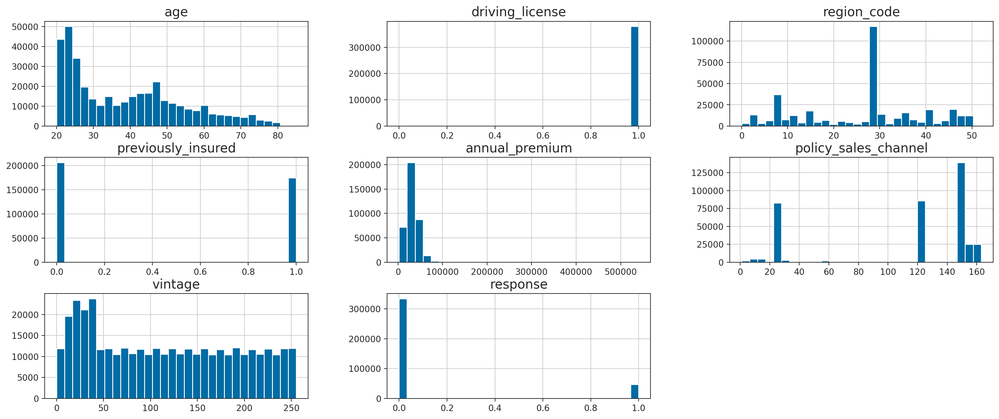

In [92]:
num_attributes.drop(columns = ['id'], inplace = True)
num_attributes.hist(bins=30);

### 1.6.2 Categorical Attributes

In [34]:
cat_attributes.describe()

,gender,vehicle_age,vehicle_damage
count,381109,381109,381109
unique,2,3,2
top,Male,1-2 Year,Yes
freq,206089,200316,192413


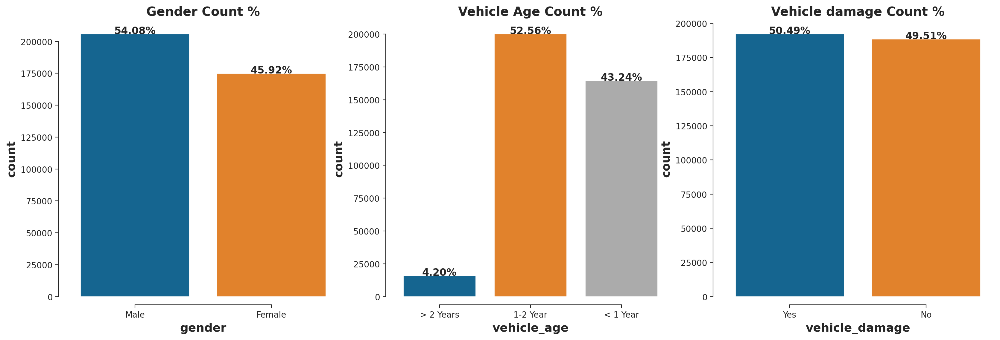

In [161]:
# categorical
plt.figure(figsize=[20,6])

# Distribuição por Gender
plt.subplot( 1, 3, 1 )
ax=sns.countplot(cat_attributes['gender'])
total=len(cat_attributes['gender'])
graphic_percentage(ax,total,'Gender Count %')
sns.despine(offset = 10, trim = True)

# Distribuição por Vehicle Age
plt.subplot( 1, 3, 2 )
ax=sns.countplot(cat_attributes['vehicle_age'])
total=len(cat_attributes['vehicle_age'])
graphic_percentage(ax,total,'Vehicle Age Count %')
sns.despine(offset = 10, trim = True)

# Distribuição por Vehicle Damage
plt.subplot( 1, 3, 3 )
ax=sns.countplot(cat_attributes['vehicle_damage'])
total=len(cat_attributes['vehicle_damage'])
graphic_percentage(ax,total,'Vehicle damage Count %')
sns.despine(offset = 10, trim = True)

# 2.0 Feature Engineering

In [69]:
#security copy
df2 = df1.copy()

In [70]:
# vehicle_age
df2['vehicle_age'] = df2['vehicle_age'].map(vehicle_age_map) 

# vehicle_damage
df2['vehicle_damage'] = df2['vehicle_damage'].map(damage_map).astype( uint8 ) 

In [71]:
# potential
# Calculus
potential =  (df2['gender'].map(gender_weight_map) + 
              df2['annual_premium'].apply(premium_weight_map) + 
              df2['age'].apply(age_weight_map) +
              df2['driving_license']) 

# insert column
df2.insert(loc=len(df2.columns)-1, column='potential', value=potential)

In [72]:
# historical
# Calculus
historical = (df2['vehicle_age']**2 + 
              df2['vehicle_damage'] + 
              df2['previously_insured'])

# insert column
df2.insert(loc=len(df2.columns)-1, column='historical', value=historical)

In [73]:
df2.head(10)

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,potential,historical,response
0,1,Male,44,1,28,0,2.000,1,40454.000,26,217,7.600,5.000,1
1,2,Male,76,1,3,0,1.500,0,33536.000,26,183,5.600,2.250,0
2,3,Male,47,1,28,0,2.000,1,38294.000,26,27,8.600,5.000,1
3,4,Male,21,1,11,1,1.000,0,28619.000,152,203,6.100,2.000,0
4,5,Female,29,1,41,1,1.000,0,27496.000,152,39,5.900,2.000,0
5,6,Female,24,1,33,0,1.000,1,2630.000,160,176,3.900,2.000,0
6,7,Male,23,1,11,0,1.000,1,23367.000,152,249,6.100,2.000,0
7,8,Female,56,1,28,0,1.500,1,32031.000,26,72,7.400,3.250,1
8,9,Female,24,1,3,1,1.000,0,27619.000,152,28,5.900,2.000,0
9,10,Female,32,1,6,1,1.000,0,28771.000,152,80,6.900,2.000,0


In [74]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int32  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int16  
 3   driving_license       381109 non-null  uint8  
 4   region_code           381109 non-null  int16  
 5   previously_insured    381109 non-null  uint8  
 6   vehicle_age           381109 non-null  float64
 7   vehicle_damage        381109 non-null  uint8  
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  int16  
 10  vintage               381109 non-null  uint8  
 11  potential             381109 non-null  float64
 12  historical            381109 non-null  float64
 13  response              381109 non-null  uint8  
dtypes: float64(4), int16(3), int32(1), object(1), uint8(

## 2.1 Hypothesis MindMap 

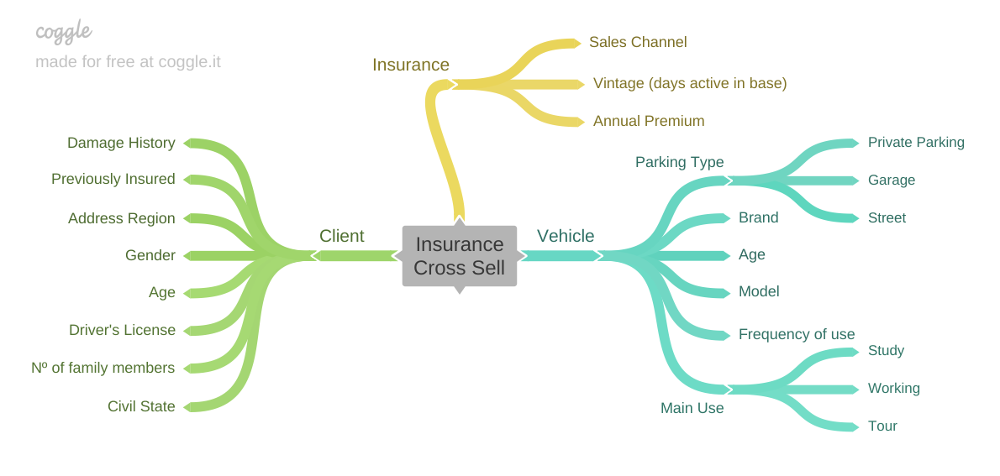

In [42]:
Image('../references/Insurance.png')

## 2.2 Business Hypothesis

**H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.   
**H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos.  
**H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
**H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos.  
**H5** - Clientes acima de 30 anos são mais interessados em adquirir seguro de veículos.   
**H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.  
**H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.  
**H8** - Apenas 10 canais de venda concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.  
**H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.

# 3.0 Data Filtering

In [75]:
#security copy
df3 = df2.copy()

# 4.0 EDA (Exploratory Data Analysis)

In [76]:
#security copy
df4 = df3.copy()

## 4.1 Univariate Analysis

### Response

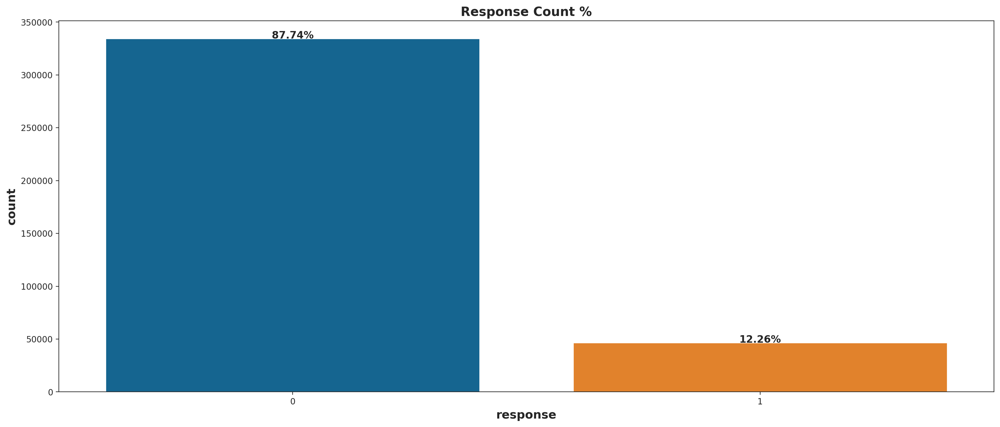

In [95]:
## response
ax=sns.countplot(df4['response'])
total=len(df4['response'])
graphic_percentage(ax,total,'Response Count %')

In [96]:
balance = df4['response'].value_counts(normalize=True)
print(f'Apenas {100*balance[1]:.2f}% dos clientes demonstraram interesse em adquirir o seguro de automóvel')

Apenas 12.26% dos clientes demonstraram interesse em adquirir o seguro de automóvel


## 4.2 Bivariate Analysis

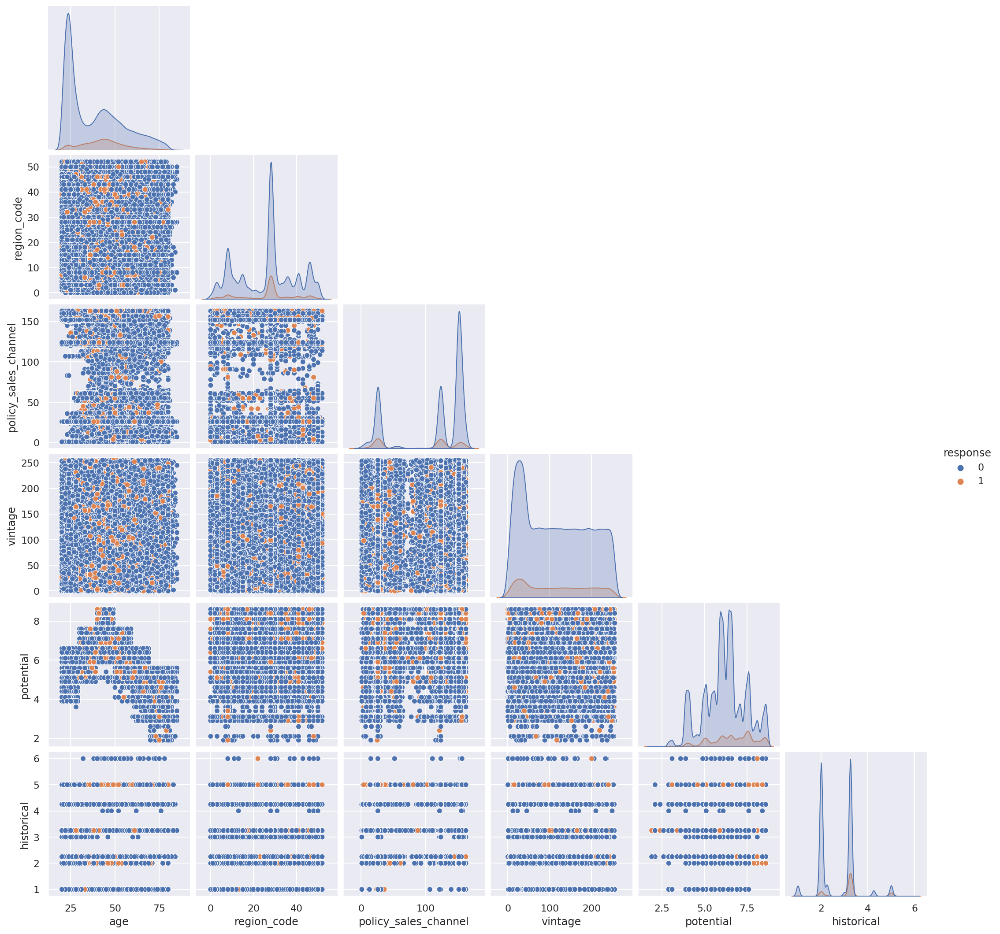

In [202]:
# pairplot
sns.pairplot(df4.drop(columns=['id'],axis=1), 
             x_vars=['age','region_code','policy_sales_channel', 'vintage', 'potential', 'historical'],
             y_vars=['age','region_code','policy_sales_channel', 'vintage', 'potential', 'historical'],
             hue='response', corner=True);

### Gender

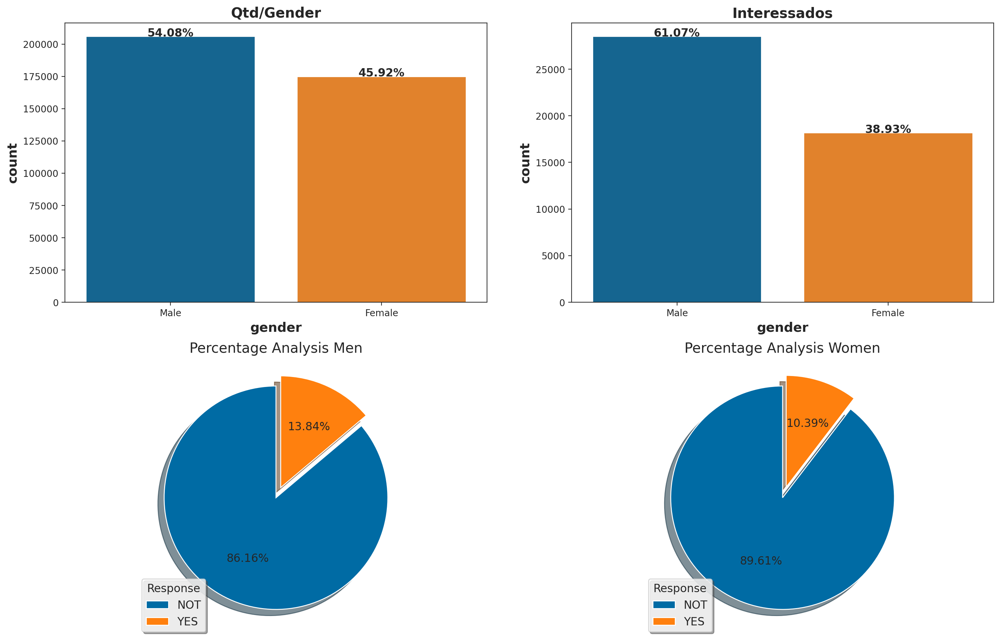

gender,Female,Male,Female,Male
response,,,,
NOT,156835,177564,0.896,0.862
YES,18185,28525,0.104,0.138


In [97]:
## gender
aux = pd.crosstab(df4['gender'], df4['response'])#.apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux = aux.T
aux = aux.rename(index={0: 'NOT', 1:'YES'})

aux2 = pd.crosstab(df4['gender'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux2 = aux2.T
aux2 = aux2.rename(index={0: 'NOT', 1:'YES'})

plt.figure(figsize=[18,12])

# Distribuição por Gênero
plt.subplot(2,2,1)
ax=sns.countplot(df4['gender'])
total=len(df4['gender'])
graphic_percentage(ax,total,'Qtd/Gender')

# Distribuição de Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['response']==1,'gender'])
total=len(df4.loc[df4['response']==1,'gender'])
graphic_percentage(ax,total,'Interessados')

# PiePlot Male
plt.subplot(2,2,3)
plt.pie(aux['Male'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Men')

# PiePlot Female
plt.subplot(2,2,4)
plt.pie(aux['Female'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Women')
plt.show()

# cross tab
pd.concat([aux,aux2], axis=1)

### Age

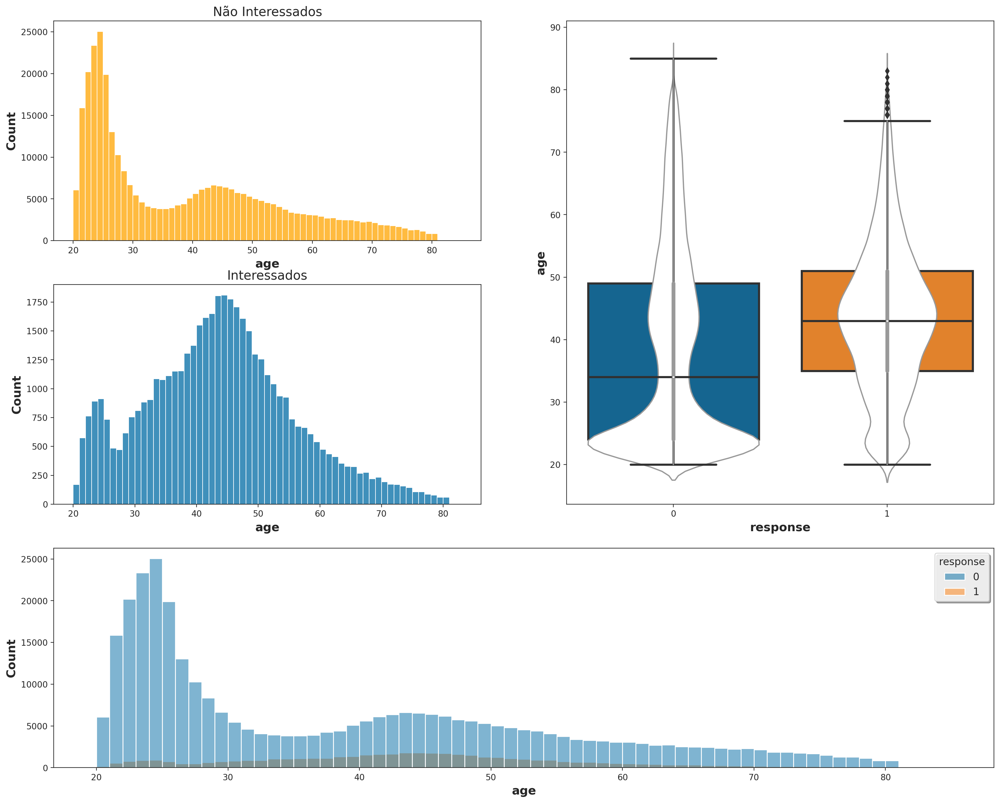

In [139]:
## age
plt.figure(figsize=[20,16])

# Distribuição de Não Interessados
plt.subplot(3,2,1)
sns.histplot(df4.loc[df4['response']==0,'age'], binwidth=1, color='orange');
plt.title('Não Interessados')

# Distribuição de Interessados
plt.subplot(3,2,3)
sns.histplot(df4.loc[df4['response']==1,'age'], binwidth=1);
plt.title('Interessados')

# Boxplot/Violinplot
plt.subplot(3,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['age'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['age'], color="white", edgecolor="gray");

# Sobreposição das distribuições
plt.subplot(3,2,(5,6))
sns.histplot(df4, x='age', hue='response', binwidth=1);

### Driving License

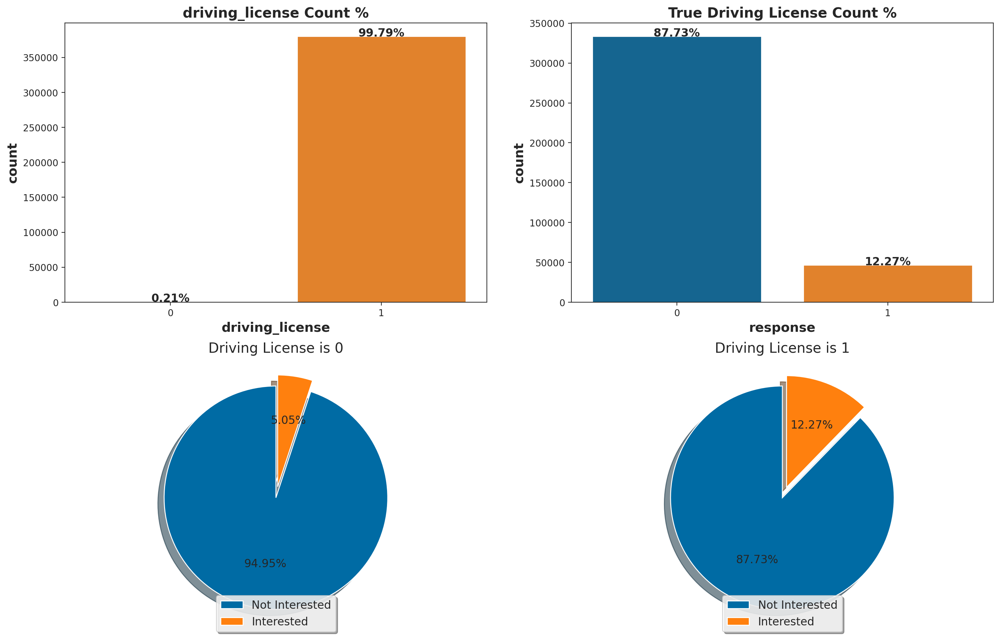

response,0,1,0,1
driving_license,,,,
0,771,41,0.950,0.050
1,333628,46669,0.877,0.123


In [101]:
## driving_license
# cross tab
df_aux_n = pd.crosstab(df4['driving_license'], df4['response'])
df_aux_p = pd.crosstab(df4['driving_license'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição por Driving License
plt.subplot(2,2,1)
ax=sns.countplot(df4['driving_license'])
total=len(df4['driving_license'])
graphic_percentage(ax,total,'driving_license Count %')

# Distribuição dos Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['driving_license']==1,'response'])
total=len(df4.loc[df4['driving_license']==1,'response'])
graphic_percentage(ax,total,'True Driving License Count %')

# Pieplot Driving License is 0
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 0')
plt.legend(loc=8);

# Pieplot Driving License is 1
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 1')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Region Code

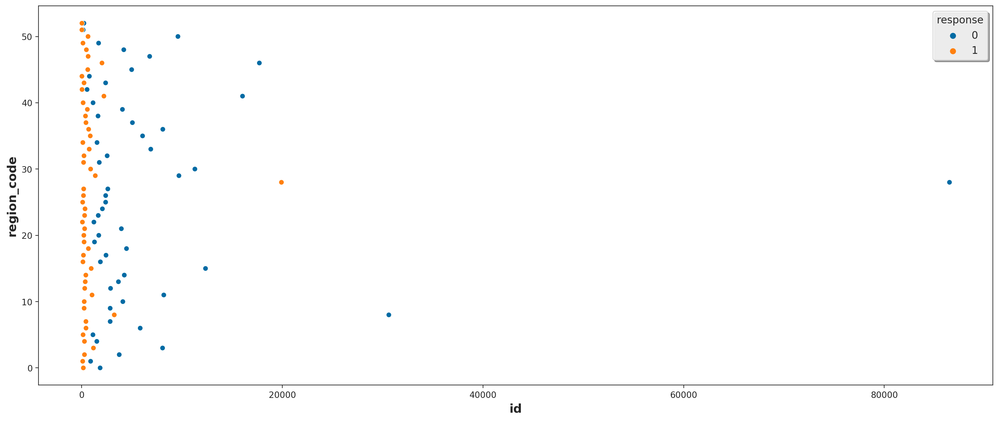

In [168]:
## region_code
aux1 = df4[['id','region_code','response']].groupby(['region_code','response']).count().reset_index()

sns.scatterplot(y=aux1.region_code, x=aux1.id, hue=aux1.response);

### Previously Insured

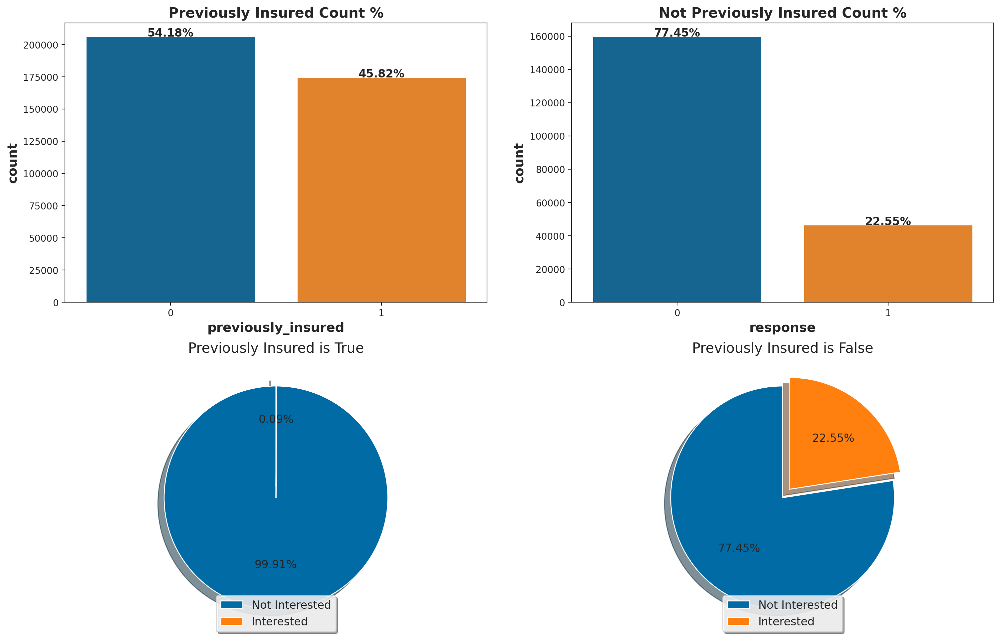

response,0,1,0,1
previously_insured,,,,
0,159929,46552,0.775,0.225
1,174470,158,0.999,0.001


In [103]:
## previously_insured
# cross tab
df_aux_n = pd.crosstab(df4['previously_insured'], df4['response'])
df_aux_p = pd.crosstab(df4['previously_insured'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

plt.subplot(2,2,1)
ax=sns.countplot(df4['previously_insured'])
total=len(df4['previously_insured'])
graphic_percentage(ax,total,'Previously Insured Count %')

plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['previously_insured']==0,'response'])
total=len(df4.loc[df4['previously_insured']==0,'response'])
graphic_percentage(ax,total,'Not Previously Insured Count %')

plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Previously Insured is True')
plt.legend(loc=8);

plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Previously Insured is False')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Vehicle Age

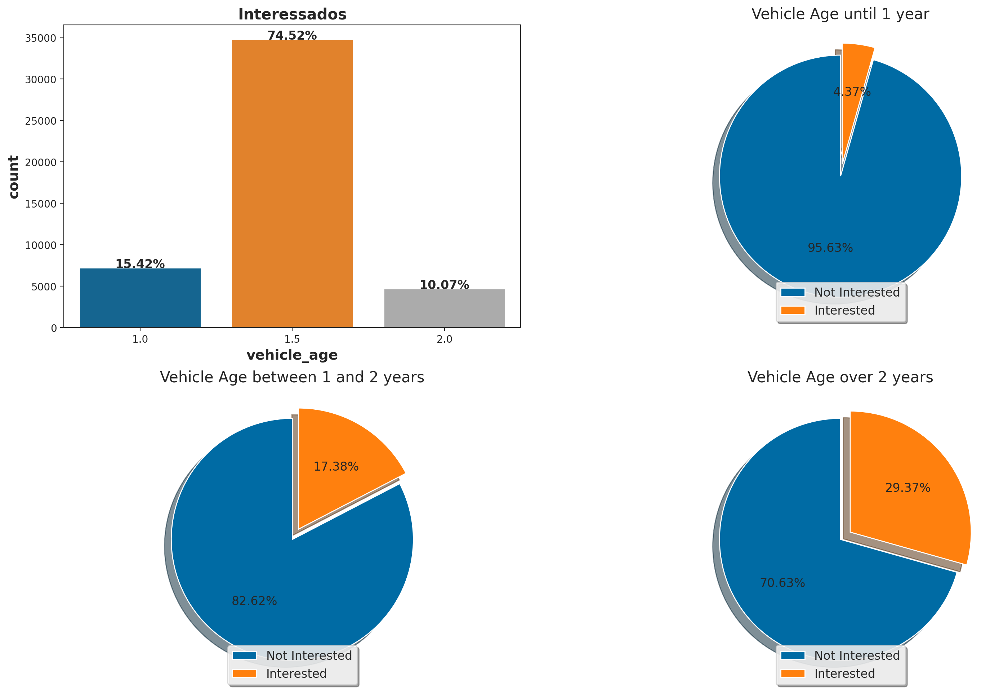

response,0,1,0,1
vehicle_age,,,,
1.000,157584,7202,0.956,0.044
1.500,165510,34806,0.826,0.174
2.000,11305,4702,0.706,0.294


In [104]:
## vehicle_age
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_age'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_age'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
ax=sns.countplot(df4.loc[df4['response']==1,'vehicle_age'])
total=len(df4.loc[df4['response']==1,'vehicle_age'])
graphic_percentage(ax,total,'Interessados')

# Pieplot Vehicle Age until 1 year
plt.subplot(2,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age until 1 year')
plt.legend(loc=8);

# Pieplot Vehicle Age between 1 and 2 years
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[1.5,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age between 1 and 2 years')
plt.legend(loc=8);

# Pieplot Vehicle Age over 2 years
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[2,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age over 2 years')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Vehicle Damage

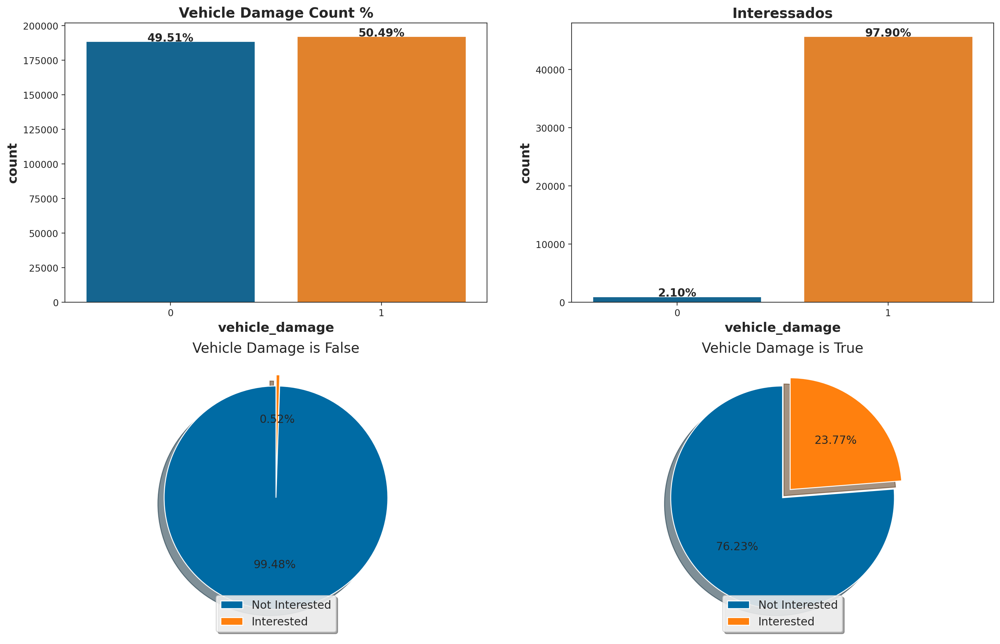

response,0,1,0,1
vehicle_damage,,,,
0,187714,982,0.995,0.005
1,146685,45728,0.762,0.238


In [105]:
# vehicle_damage
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_damage'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_damage'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição por Vehicle Damage
plt.subplot(2,2,1)
ax=sns.countplot(df4['vehicle_damage'])
total=len(df4['vehicle_damage'])
graphic_percentage(ax,total,'Vehicle Damage Count %')

# Distribuição de Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['response']==1,'vehicle_damage'])
total=len(df4.loc[df4['response']==1,'vehicle_damage'])
graphic_percentage(ax,total,'Interessados')

# Pieplot Vehicle Damage is False
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is False')
plt.legend(loc=8);

# Pieplot Vehicle Damage is True
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is True')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Annual Premium

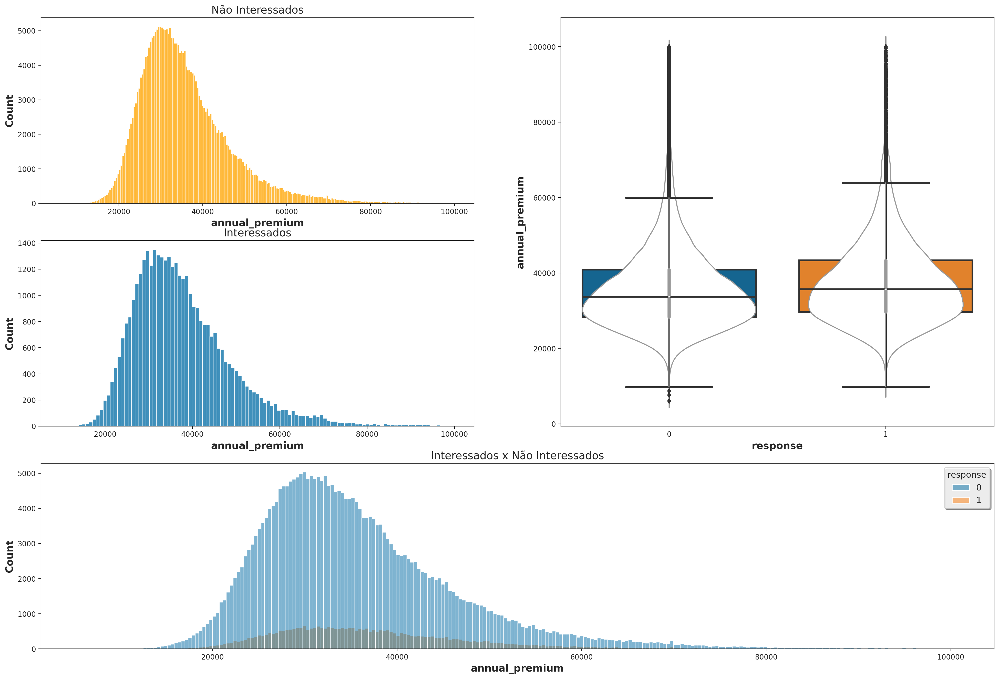

In [107]:
## annual_premium
aux01 = df4[(df4['annual_premium'] > 3000) & (df4['annual_premium'] < 100000)]
aux02 = aux01.loc[aux01['response'] == 0, 'annual_premium']

aux03 = df4[(df4['annual_premium'] > 3000) & (df4['annual_premium'] < 100000)]
aux04 = aux03.loc[aux01['response'] == 1, 'annual_premium']

aux05 = df4.loc[(df4['annual_premium']>3000)&(df4['annual_premium']<100000), 'annual_premium']

plt.figure(figsize=[24,16])

# Distribuição de Não Interessados
plt.subplot(3,2,1)
sns.histplot(aux02, color = 'orange')
plt.title('Não Interessados')

# Distribuição de Interessados
plt.subplot(3,2,3)
sns.histplot(aux04)
plt.title('Interessados')

# Boxplot/Violinplot
plt.subplot(3,2,(2,4))
sns.boxplot(x=df4['response'], y=aux01.annual_premium, linewidth=2.5);
sns.violinplot(x=df4['response'], y=aux01.annual_premium, color="white", edgecolor="gray");

# Sobreposição das distribuições
plt.subplot(3,2,(5,6))
sns.histplot(aux01, x = 'annual_premium', hue = 'response');
plt.title('Interessados x Não Interessados');

### Policy Sales Channel

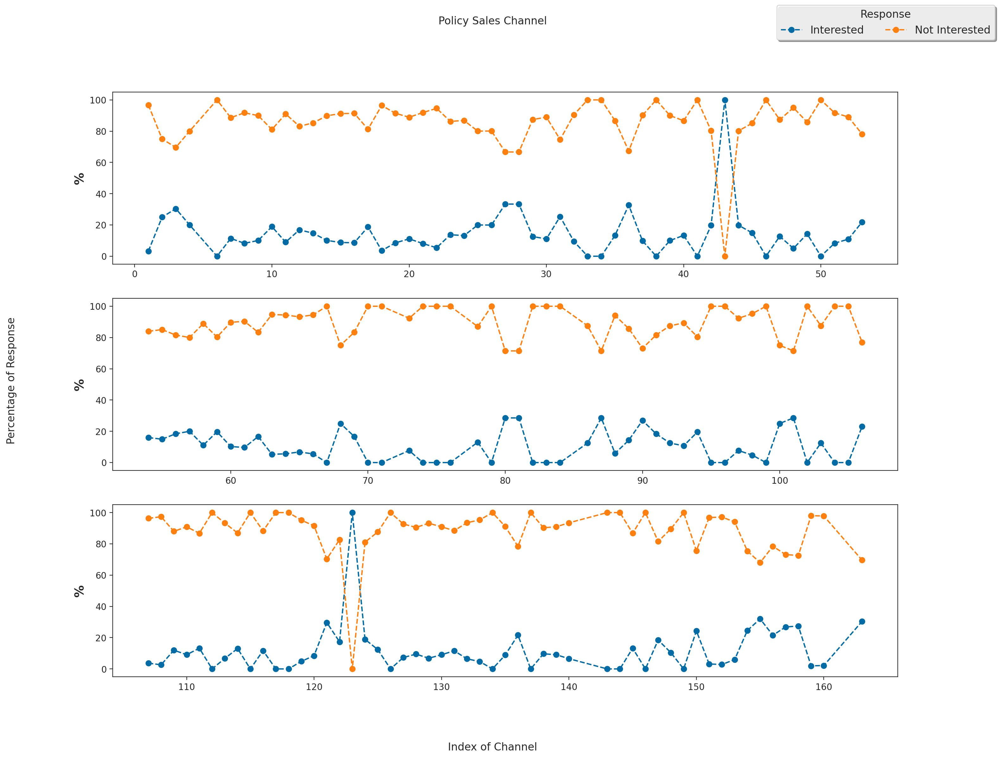

In [108]:
## policy_sales_channel
aux_index = df4['policy_sales_channel'].unique()
aux = pd.DataFrame({'yes':[1],'not':[0]}, index=aux_index)

aux['yes']= df4.groupby('policy_sales_channel')['response'].sum()
aux['not']= df4.groupby('policy_sales_channel')['response'].count()-aux['yes']

aux.index.names = ['psc']
aux = aux.sort_values('psc',ascending=True)

# separate classes
aux01 = aux[(aux.index>=0)&(aux.index<=53)]
aux02 = aux[(aux.index>53)&(aux.index<=106)]
aux03 = aux[aux.index>106]

# stacked data
stacked_data_01 = aux01.apply(lambda x: x*100/sum(x), axis=1)
stacked_data_02 = aux02.apply(lambda x: x*100/sum(x), axis=1)
stacked_data_03 = aux03.apply(lambda x: x*100/sum(x), axis=1)

# plot
fig = plt.figure(figsize=(16,12))
fig.suptitle('Policy Sales Channel')
fig.supxlabel('Index of Channel')
fig.supylabel('Percentage of Response')

ax1 = fig.add_subplot(3, 1, 1, ylabel='%')
ax1.plot(stacked_data_01, marker='o', linestyle='--', label=['Interested','Not Interested']);
ax2 = fig.add_subplot(3, 1, 2, ylabel='%')
ax2.plot(stacked_data_02, marker='o', linestyle='--');
ax3 = fig.add_subplot(3, 1, 3, ylabel='%')
ax3.plot(stacked_data_03, marker='o', linestyle='--');

fig.legend(title='Response', ncol=2);

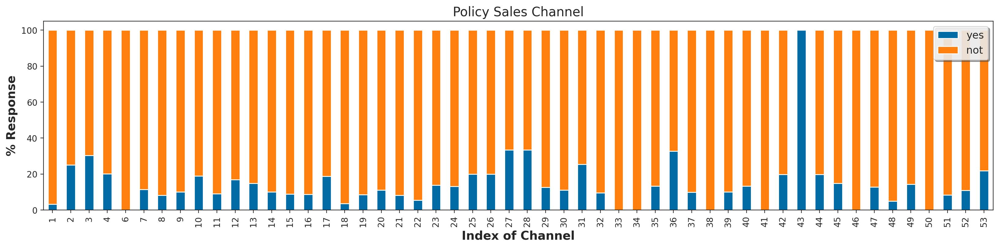

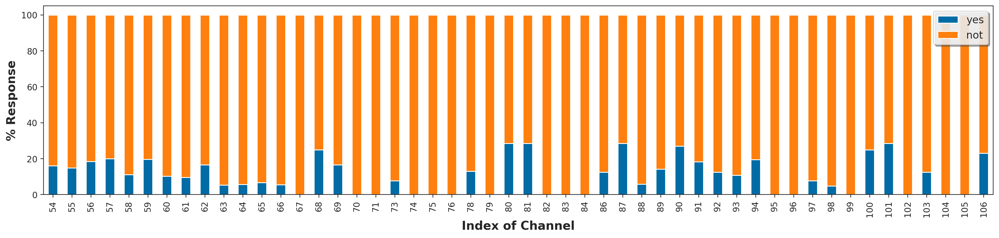

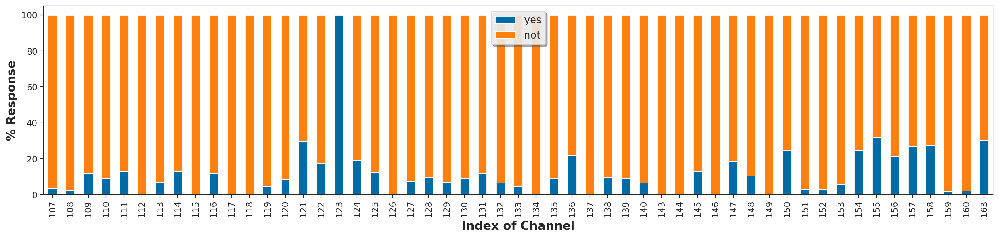

In [109]:
# 100% stacked bar
stacked_data_01.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel').set_title('Policy Sales Channel');
stacked_data_02.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel');
stacked_data_03.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel');

### Vintage

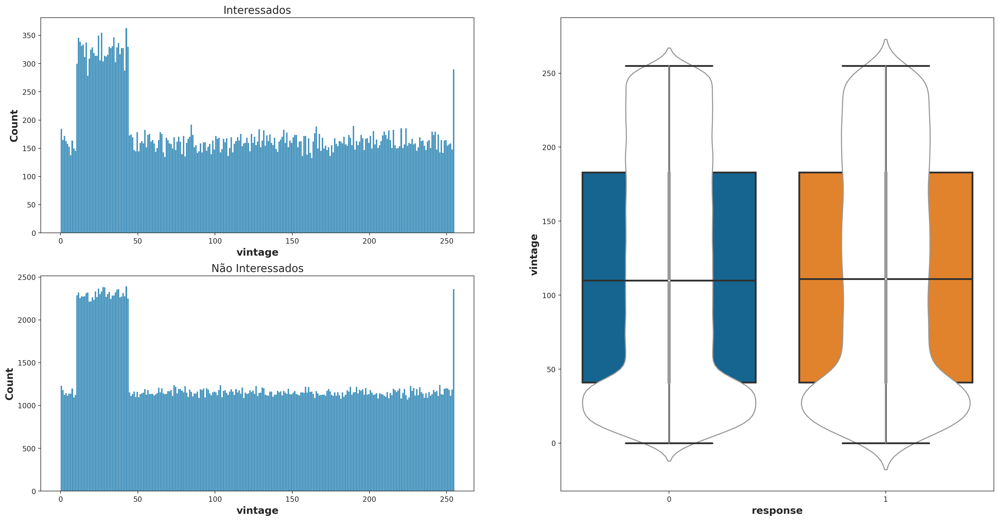

In [110]:
## vintage
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
sns.histplot(df4.loc[df4['response']==1,'vintage'], binwidth=1);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
sns.histplot(df4.loc[df4['response']==0,'vintage'], binwidth=1);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['vintage'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['vintage'], color="white", edgecolor="gray");

### Potential

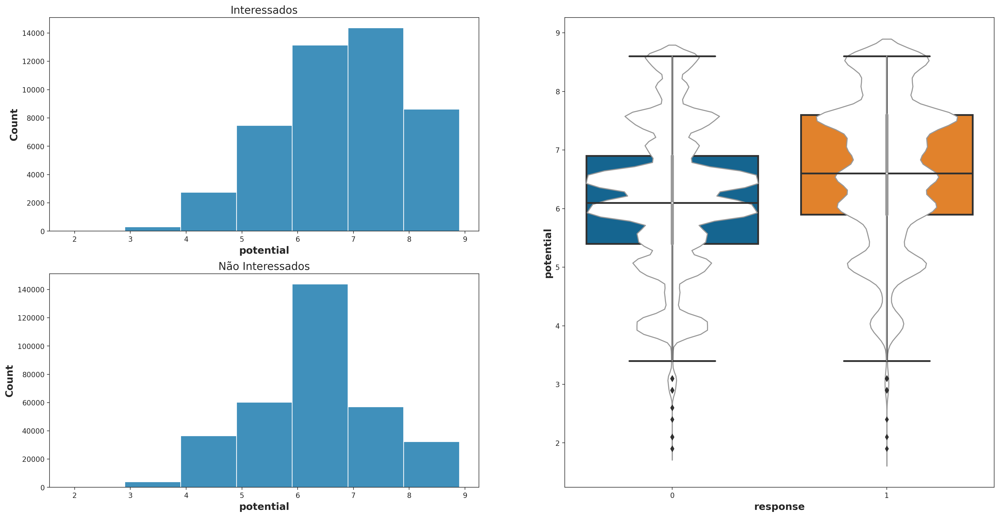

In [111]:
## potential
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
sns.histplot(df4.loc[df4['response']==1,'potential'], binwidth=1);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
sns.histplot(df4.loc[df4['response']==0,'potential'], binwidth=1);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['potential'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['potential'], color="white", edgecolor="gray");

### Historical

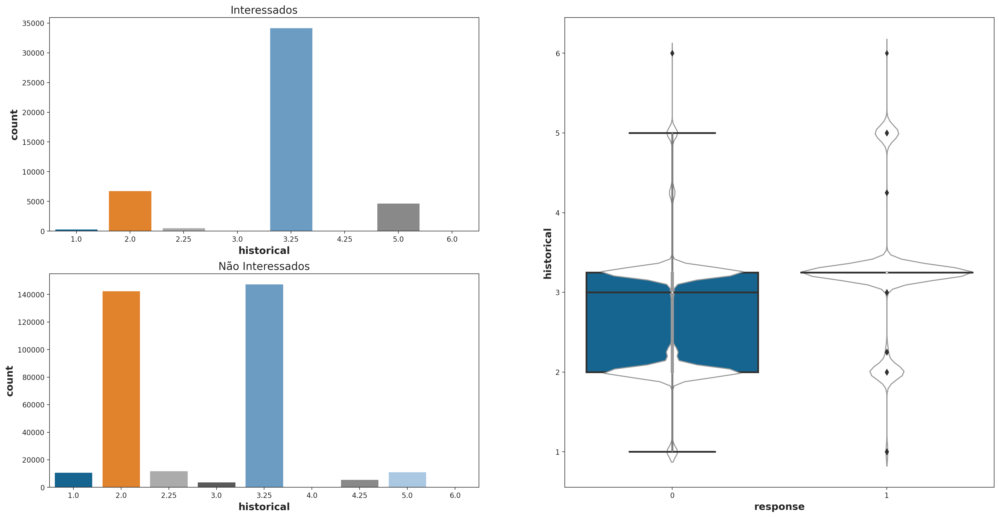

In [112]:
## historical
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
#sns.histplot(df4.loc[df4['response']==1,'historical'], binwidth=1);
sns.countplot(df4.loc[df4['response']==1,'historical']);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
#sns.histplot(df4.loc[df4['response']==0,'historical'], binwidth=1);
sns.countplot(df4.loc[df4['response']==0,'historical']);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['historical'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['historical'], color="white", edgecolor="gray");

## 4.3 Multivariate Analysis

### 4.3.1 Numerical Attributes

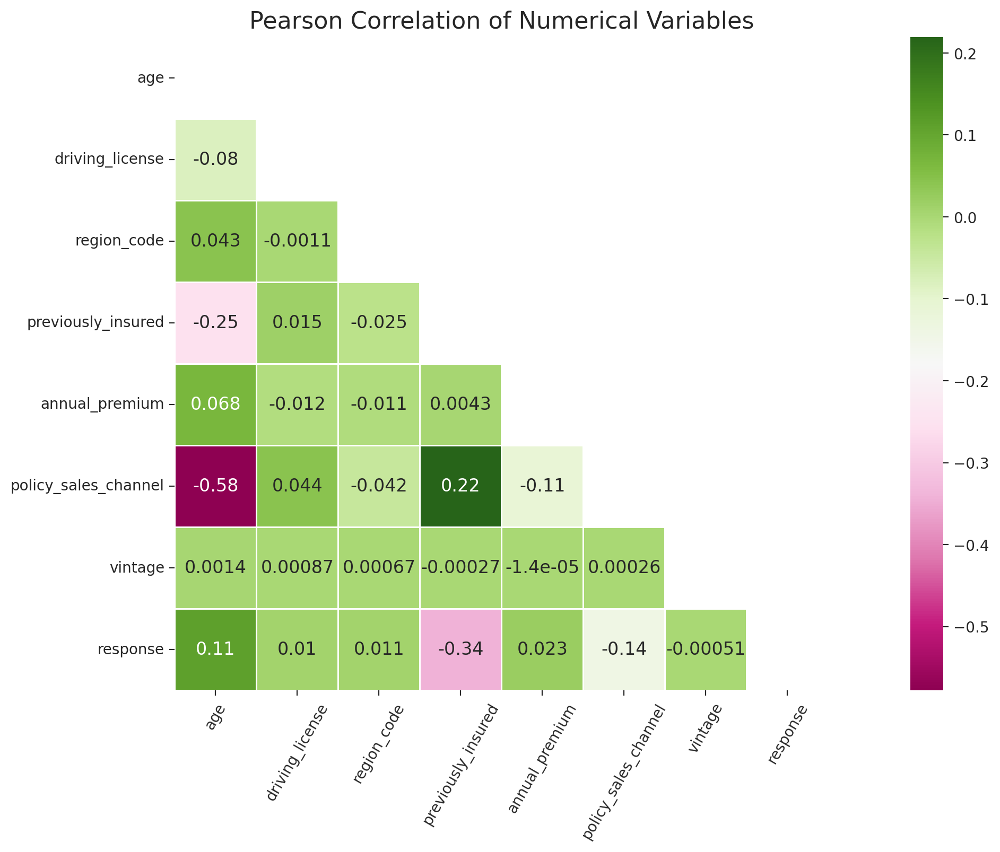

In [143]:
# correlation
corr = num_attributes.corr(method = 'pearson')

# Creating a with mask for the superior triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("ticks"):
    # Creating the chart with mask
    plt.figure(figsize(20,8))
    ax = sns.heatmap(corr, mask=mask, annot = True, linewidths=.5, square=True, cmap="PiYG")
    plt.xticks(size = 10, rotation=60)
    plt.yticks(size = 10)
    plt.title("Pearson Correlation of Numerical Variables", size=16);

### 4.3.2 Categorical Attributes

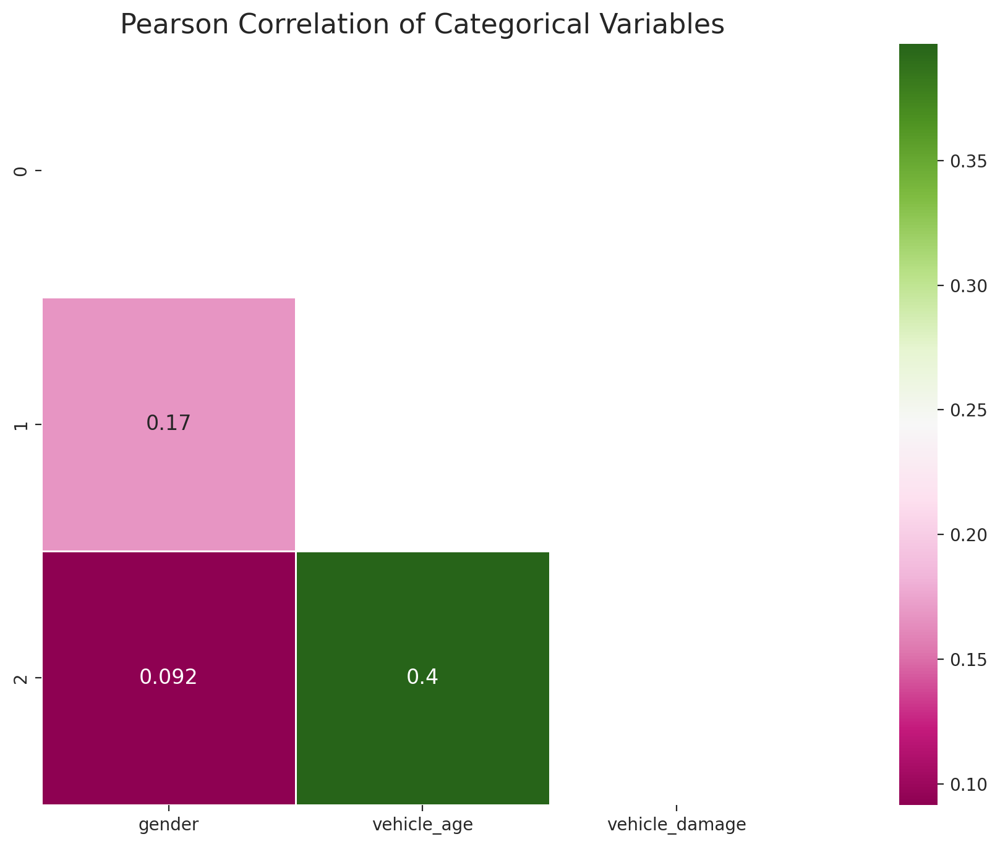

In [144]:
# correlation
corr = pd.DataFrame(corr_cramer_v(cat_attributes))

# Creating a with mask for the superior triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("ticks"):
    # Creating the chart with mask
    plt.figure(figsize(20,8))
    ax = sns.heatmap(corr, mask=mask, annot = True, linewidths=.5, square=True, cmap="PiYG")
    plt.xticks(size = 10, rotation=0)
    plt.yticks(size = 10)
    plt.title("Pearson Correlation of Categorical Variables", size=16);

## 4.4 Business Hypothesis

### 4.4.1 Hypothesis MindMap 

### 4.4.2 Hypothesis Creation

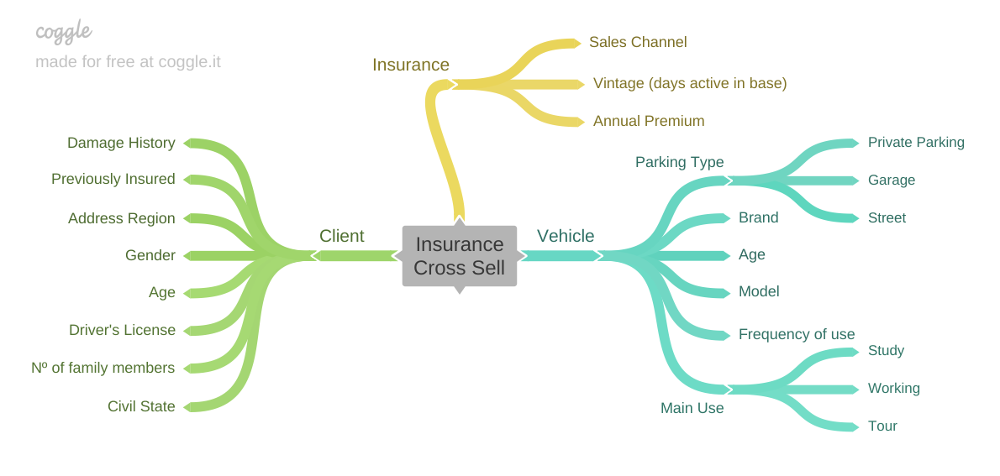

In [51]:
Image('../references/Insurance.png')

**H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.   
**H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos.  
**H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
**H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos.  
**H5** - Clientes na faixa etária de 30 a 40 anos são mais interessados em adquirir seguro de veículos.   
**H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.  
**H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.  
**H8** - Apenas 10 canais de venda concentram a maioria dos clientes que estão interessados em adquirir seguro de veículos.  
**H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.

### 4.2.3 Hypothesis Validation

#### **H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.  
   - **Verdadeira**: Entre os interessados em adquirir o seguro de carro, mais de 60% são homens. Além disso, entre os homens o percentual de interesse é de 14%, enquanto entre as mulheres é de apenas 10%

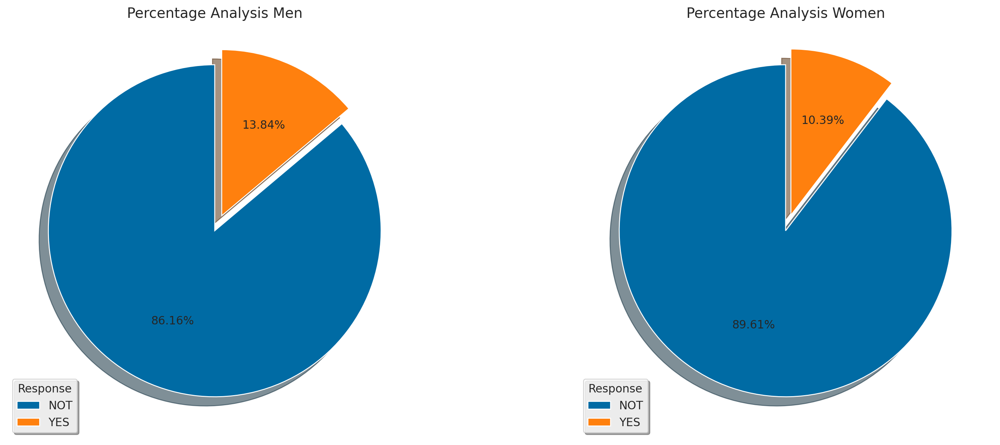

gender,Female,Male,Female,Male
response,,,,
NOT,156835,177564,0.896,0.862
YES,18185,28525,0.104,0.138


In [115]:
## gender
aux = pd.crosstab(df4['gender'], df4['response'])
aux = aux.T
aux = aux.rename(index={0: 'NOT', 1:'YES'})

aux2 = pd.crosstab(df4['gender'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux2 = aux2.T
aux2 = aux2.rename(index={0: 'NOT', 1:'YES'})

plt.figure(figsize=[20,8])

# PiePlot Male
plt.subplot(1,2,1)
plt.pie(aux['Male'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Men')

# PiePlot Female
plt.subplot(1,2,2)
plt.pie(aux['Female'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Women')
plt.show()

# cross tab
pd.concat([aux,aux2], axis=1)

#### **H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos. 
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, quase 75% possuem carros seminovos. Apesar disso, entre os que possuem carros mais velhos o percentual de interesse é de quase 30%, enquanto entre os que possuem carros novos e seminovos o percentual de interesse é de apenas 5% e 17%, respectivamente.

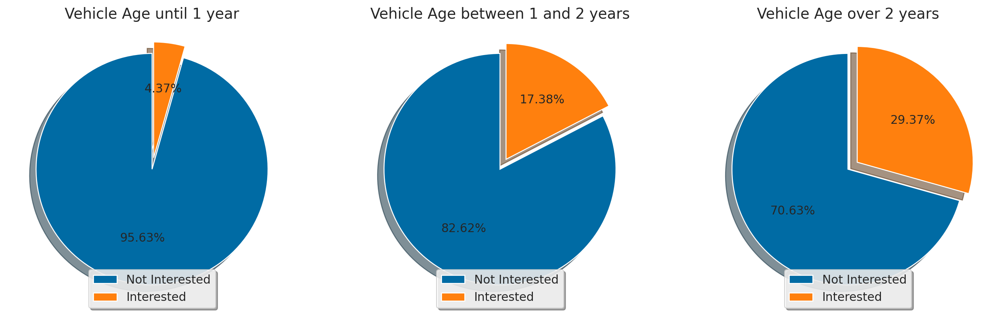

response,0,1,0,1
vehicle_age,,,,
1.000,157584,7202,0.956,0.044
1.500,165510,34806,0.826,0.174
2.000,11305,4702,0.706,0.294


In [116]:
## vehicle_age
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_age'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_age'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Pieplot Vehicle Age until 1 year
plt.subplot(1,3,1)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age until 1 year')
plt.legend(loc=8);

# Pieplot Vehicle Age between 1 and 2 years
plt.subplot(1,3,2)
plt.pie(df_aux_n.loc[1.5,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age between 1 and 2 years')
plt.legend(loc=8);

# Pieplot Vehicle Age over 2 years
plt.subplot(1,3,3)
plt.pie(df_aux_n.loc[2,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age over 2 years')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, quase a totalidade (99,79%) possui carteira de motorista. Apesar disso, entre os que não possuem carteira, 5% deles (41 clientes) demonstraram interesse no seguro de carro.

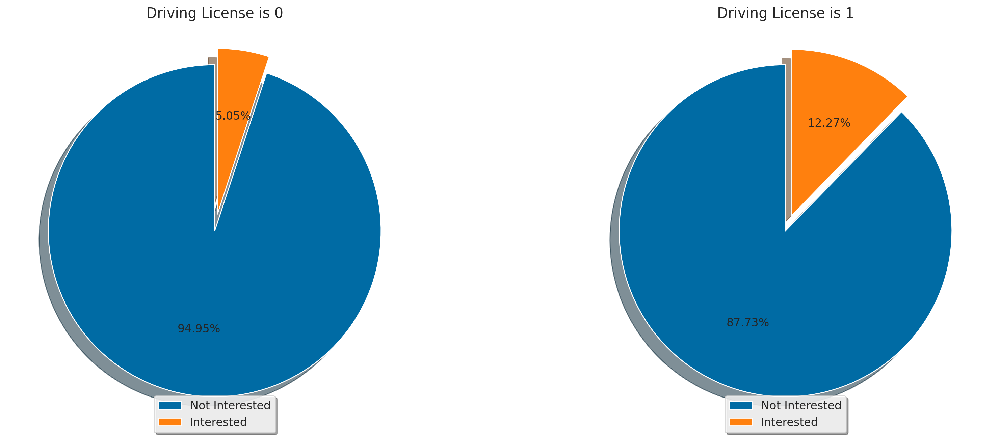

response,0,1,0,1
driving_license,,,,
0,771,41,0.950,0.050
1,333628,46669,0.877,0.123


In [117]:
## driving_license
# cross tab
df_aux_n = pd.crosstab(df4['driving_license'], df4['response'])
df_aux_p = pd.crosstab(df4['driving_license'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[20,8])

# Pieplot Driving License is 0
plt.subplot(1,2,1)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 0')
plt.legend(loc=8);

# Pieplot Driving License is 1
plt.subplot(1,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 1')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos. 
   - **Verdadeira**: Entre os interessados em adquirir o seguro de carro, quase a totalidade (97,90%) já teve episódio de acidente ou dano ao veículo. Além disso, cerca de 24% deles demonstraram interesse no seguro de carro, enquanto que entre os que nunca tiveram acidente/dano ao veículo este percentual é de apenas 0.5%.

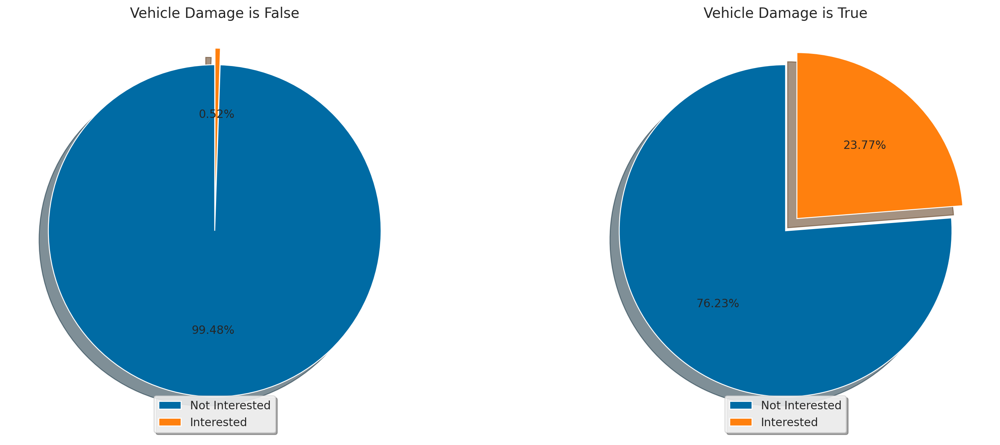

response,0,1,0,1
vehicle_damage,,,,
0,187714,982,0.995,0.005
1,146685,45728,0.762,0.238


In [118]:
# vehicle_damage
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_damage'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_damage'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[20,8])

# Pieplot Vehicle Damage is False
plt.subplot(1,2,1)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is False')
plt.legend(loc=8);

# Pieplot Vehicle Damage is True
plt.subplot(1,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is True')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H5** - Clientes na faixa etária de 30 a 40 anos são mais interessados em adquirir seguro de veículos. 
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 35% se encontram na faixa etária de 40 a 50 anos. Além disso, dentro desta faixa específica, o percentual de interesse é de 21,24%, contra os 20% de interesse na faixa de 30 a 40 anos.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
20-30,6374.000,148829.000,4.107,95.893,13.646,44.506
30-40,10856.000,43397.000,20.010,79.990,23.241,12.978
40-50,16319.000,60527.000,21.236,78.764,34.937,18.100
50-60,8497.000,39537.000,17.690,82.310,18.191,11.823
60-70,3325.000,25698.000,11.456,88.544,7.118,7.685
70-80,1339.000,16411.000,7.544,92.456,2.867,4.908


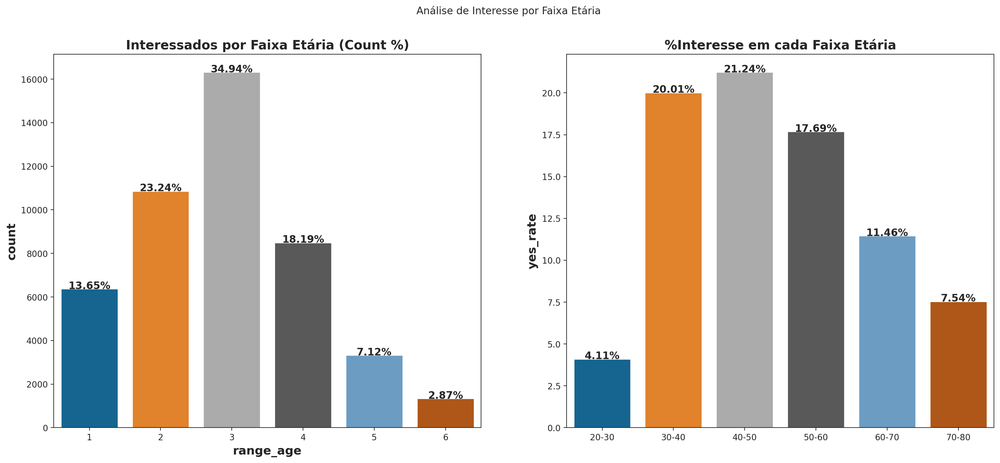

In [119]:
# range age map
df_aux = df4[['response','age']].copy()
df_aux['range_age'] = df_aux['age'].map(age_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_age']

# calculate sum by range age
yes_acc = df_aux.groupby('range_age')['response'].sum()
no_acc  = df_aux.groupby('range_age')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_age.unique()) # sort range_age
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['20-30','30-40','40-50','50-60','60-70','70-80']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Etária')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Etária (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Etária')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 32% se encontram na faixa de gasto entre 30 e 40 mil. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este o segundo pior percentual entre todos as demais faixas de gastos. Pode-se dizer que quanto maior o gasto o anual com o seguro de saúde, maior é o interesse em adquirir o  seguro de carro.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
0-20,8962.000,61722.000,12.679,87.321,19.186,18.458
20-30,9572.000,85809.000,10.036,89.964,20.492,25.661
30-40,14997.000,110050.000,11.993,88.007,32.107,32.910
40-50,8280.000,49508.000,14.328,85.672,17.726,14.805
50-60,3060.000,16989.000,15.263,84.737,6.551,5.080
60-70,1115.000,6156.000,15.335,84.665,2.387,1.841
70-80,358.000,2166.000,14.184,85.816,0.766,0.648
80-100,366.000,1999.000,15.476,84.524,0.784,0.598


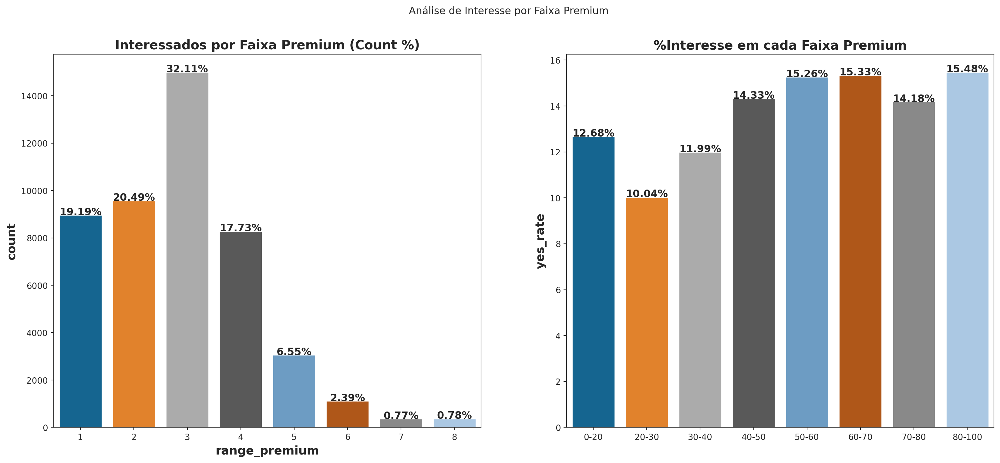

In [120]:
# range premium map
df_aux = df4[['response','annual_premium']].copy()
df_aux['range_premium'] = df_aux['annual_premium'].map(premium_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_premium']

# calculate sum by range_premium
yes_acc = df_aux.groupby('range_premium')['response'].sum()
no_acc  = df_aux.groupby('range_premium')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_premium.unique()) # sort range_premium
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['0-20','20-30','30-40','40-50','50-60','60-70','70-80','80-100']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Premium')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Premium (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Premium')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 32,60% entraram na base há no máximo 2 meses. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este semelhante a todos das demais faixas de tempo. Pode-se dizer que o interesse em adquirir o seguro de carro independe de quanto tempo faz que o cliente está na base.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
0-60,15229.000,107991.000,12.359,87.641,32.603,32.294
60-120,9506.000,69688.000,12.003,87.997,20.351,20.840
120-180,9668.000,69074.000,12.278,87.722,20.698,20.656
180-240,9762.000,68917.000,12.407,87.593,20.899,20.609
240-300,2545.000,18729.000,11.963,88.037,5.449,5.601


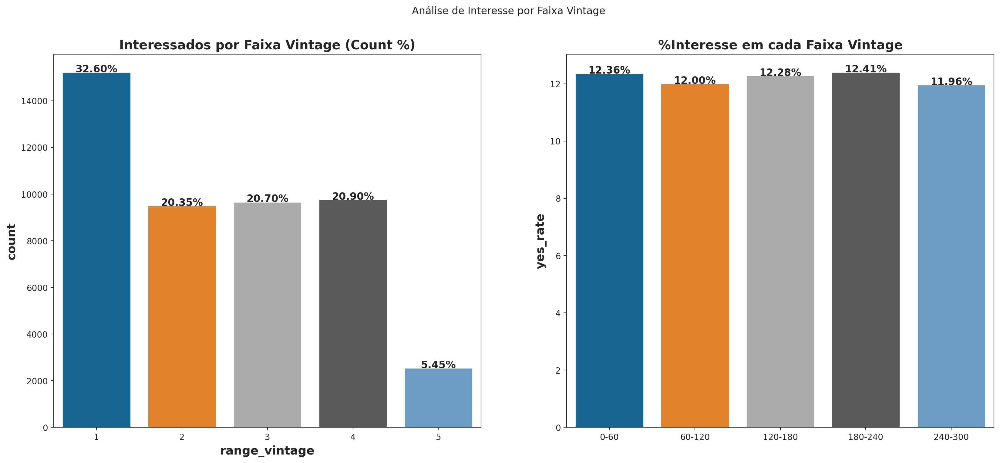

In [121]:
# range vintage map
df_aux = df4[['response','vintage']].copy()
df_aux['range_vintage'] = df_aux['vintage'].map(vintage_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_vintage']

# calculate sum by range_premium
yes_acc = df_aux.groupby('range_vintage')['response'].sum()
no_acc  = df_aux.groupby('range_vintage')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_vintage.unique()) # sort range_vintage
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['0-60','60-120','120-180','180-240','240-300']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Vintage')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Vintage (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Vintage')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H8** - Apenas 10 canais de venda concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.
   - **Verdadeira**: Entre os 155 canais de venda catalogados na base, em apenas 10 deles estão concentrados 42780 clientes interessados em adquirir o seguro de carro, o que representa mais de 90% do total de clientes interessados. Além disso, há 34 canais de vendas pelos quais nenhum cliente demonstrou interesse em adquirir o novo produto.

Total de Interessados no Top-10 channels: 42780 (91.59% do Total de Interessados)
Total de Interessados: 46710
Total de Canais sem nenhum interessado: 34


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154
channel,26.000,124.000,152.000,156.000,157.000,122.000,154.000,163.000,160.000,155.000,25.000,13.000,55.000,7.000,31.000,3.000,30.000,158.000,12.000,125.000,8.000,151.000,52.000,11.000,29.000,4.000,24.000,15.000,150.000,120.000,14.000,23.000,61.000,60.000,10.000,16.000,136.000,153.000,1.000,147.000,91.000,42.000,59.000,145.000,109.000,44.000,121.000,19.000,116.000,22.000,36.000,9.000,54.000,37.000,131.000,128.000,139.000,56.000,138.000,21.000,106.000,35.000,94.000,103.000,111.000,135.000,47.000,148.000,127.000,140.000,53.000,113.000,45.000,90.000,86.000,18.000,64.000,119.000,133.000,81.000,132.000,80.000,65.000,17.000,129.000,92.000,93.000,78.000,114.000,20.000,107.000,130.000,49.000,32.000,40.000,87.000,88.000,89.000,101.000,100.000,73.000,69.000,43.000,28.000,48.000,2.000,27.000,123.000,159.000,51.000,39.000,57.000,58.000,62.000,97.000,63.000,98.000,66.000,110.000,108.000,68.000,137.000,146.000,134.000,6.000,143.000,144.000,149.000,41.000,126.000,33.000,46.000,50.000,38.000,67.000,70.000,71.000,74.000,75.000,76.000,79.000,82.000,83.000,84.000,95.000,96.000,99.000,104.000,105.000,112.000,115.000,117.000,118.000,34.000,102.000
total,15891.000,13996.000,3858.000,2297.000,1794.000,1720.000,1474.000,880.000,475.000,395.000,369.000,275.000,189.000,182.000,160.000,159.000,156.000,135.000,132.000,127.000,125.000,122.000,115.000,108.000,106.000,102.000,99.000,78.000,76.000,65.000,63.000,58.000,56.000,53.000,50.000,45.000,40.000,36.000,35.000,34.000,29.000,26.000,25.000,23.000,21.000,20.000,19.000,19.000,18.000,18.000,17.000,17.000,16.000,15.000,14.000,13.000,13.000,12.000,12.000,12.000,12.000,10.000,9.000,9.000,9.000,9.000,8.000,8.000,8.000,7.000,7.000,7.000,7.000,7.000,6.000,6.000,5.000,5.000,4.000,4.000,4.000,4.000,4.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
percentage,0.199,0.189,0.029,0.215,0.268,0.173,0.246,0.304,0.022,0.320,0.200,0.147,0.150,0.114,0.254,0.304,0.111,0.274,0.169,0.124,0.083,0.031,0.109,0.090,0.126,0.200,0.132,0.088,0.244,0.085,0.101,0.137,0.097,0.103,0.189,0.086,0.216,0.059,0.033,0.185,0.184,0.197,0.197,0.132,0.120,0.198,0.297,0.086,0.117,0.054,0.327,0.101,0.160,0.099,0.116,0.095,0.091,0.185,0.097,0.081,0.231,0.133,0.196,0.125,0.132,0.089,0.127,0.104,0.073,0.065,0.219,0.067,0.149,0.269,0.125,0.036,0.056,0.049,0.047,0.286,0.065,0.286,0.068,0.188,0.068,0.125,0.107,0.130,0.130,0.111,0.037,0.091,0.143,0.095,0.133,0.286,0.059,0.143,0.286,0.250,0.077,0.167,1.000,0.333,0.050,0.250,0.333,1.000,0.020,0.083,0.100,0.200,0.111,0.167,0.077,0.053,0.048,0.056,0.091,0.026,0.250,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


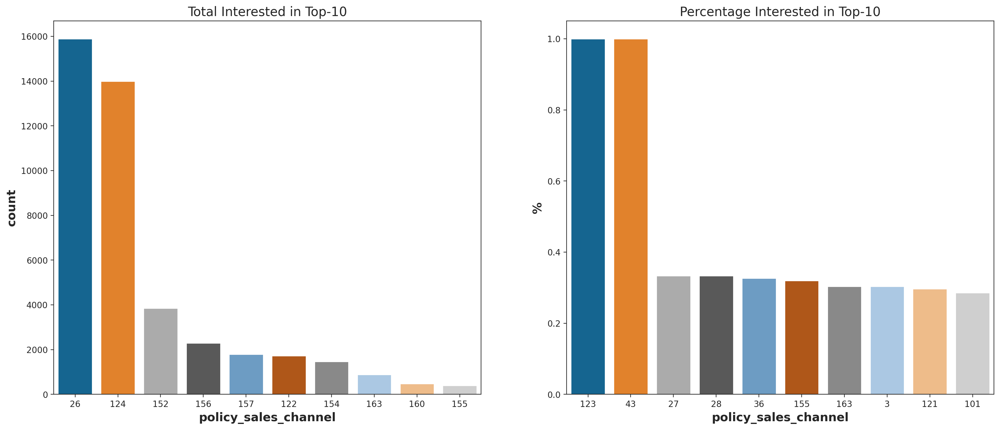

In [218]:
# top k channels
k=10

df_aux1 = df4.groupby('policy_sales_channel')['response'].sum().sort_values(ascending=False).reset_index() # total
df_aux2 = df4.groupby('policy_sales_channel')['response'].mean().sort_values(ascending=False).reset_index() # percentage
df_aux = pd.merge(df_aux1, df_aux2, on='policy_sales_channel', how='inner') # merge 
df_aux.columns = ['channel','total','percentage']

plt.figure(figsize=[20,8])

# Total Interested
plt.subplot(1,2,1)
sns.barplot(x='policy_sales_channel', y='response', data=df_aux1.head(k), order=df_aux1.policy_sales_channel.head(k));
plt.title(f'Total Interested in Top-{k}')
plt.ylabel('count')

# Percentage Interested
plt.subplot(1,2,2)
sns.barplot(x='policy_sales_channel', y='response', data=df_aux2.head(k), order=df_aux2.policy_sales_channel.head(k));
plt.title(f'Percentage Interested in Top-{k}')
plt.ylabel('%');

total_top_k = int(df_aux1.head(k).response.sum())
total_all = int(df_aux.total.sum())
percentage  = 100*total_top_k/total_all

print(f'Total de Interessados no Top-{k} channels: {total_top_k} ({np.round(percentage,2)}% do Total de Interessados)')
print(f'Total de Interessados: {total_all}')
print(f'Total de Canais sem nenhum interessado: {df_aux.total.value_counts()[0]}')
df_aux.T

#### **H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.
   - **Falsa**: Entre os 53 region_code catalogados na base, no Top-10 estão concentrados 33740 clientes interessados em adquirir o seguro de carro, o que representa cerca de 72% do total de clientes interessados. Com exceção da região de código 28, que sozinha representa quase 43% da base de interessados, nas demais regiões o percentual de interesse é mais uniforme.

Total de Interessados no Top-10 regions: 33740 (72.23% do Total de Interessados)
Total de Interessados: 46710


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52
region,28.000,8.000,41.000,46.000,29.000,3.000,11.000,15.000,30.000,35.000,33.000,36.000,18.000,47.000,50.000,45.000,39.000,48.000,6.000,37.000,7.000,14.000,38.000,13.000,24.000,12.000,21.000,23.000,2.000,4.000,10.000,9.000,19.000,43.000,32.000,20.000,27.000,31.000,26.000,17.000,0.000,40.000,5.000,49.000,16.000,34.000,1.000,25.000,22.000,42.000,44.000,52.000,51.000
total,19917.000,3257.000,2224.000,2032.000,1365.000,1181.000,1041.000,958.000,900.000,865.000,760.000,703.000,678.000,652.000,642.000,615.000,574.000,477.000,439.000,436.000,432.000,422.000,389.000,364.000,342.000,312.000,303.000,300.000,287.000,285.000,263.000,253.000,250.000,244.000,239.000,223.000,209.000,197.000,187.000,184.000,174.000,153.000,148.000,137.000,134.000,126.000,109.000,107.000,83.000,44.000,33.000,33.000,28.000
percentage,0.187,0.096,0.122,0.103,0.123,0.128,0.113,0.072,0.074,0.125,0.099,0.080,0.132,0.088,0.063,0.110,0.124,0.102,0.070,0.079,0.132,0.090,0.192,0.090,0.142,0.098,0.071,0.153,0.071,0.158,0.060,0.082,0.163,0.092,0.086,0.115,0.074,0.101,0.072,0.070,0.086,0.118,0.116,0.075,0.067,0.076,0.108,0.043,0.063,0.074,0.041,0.124,0.153


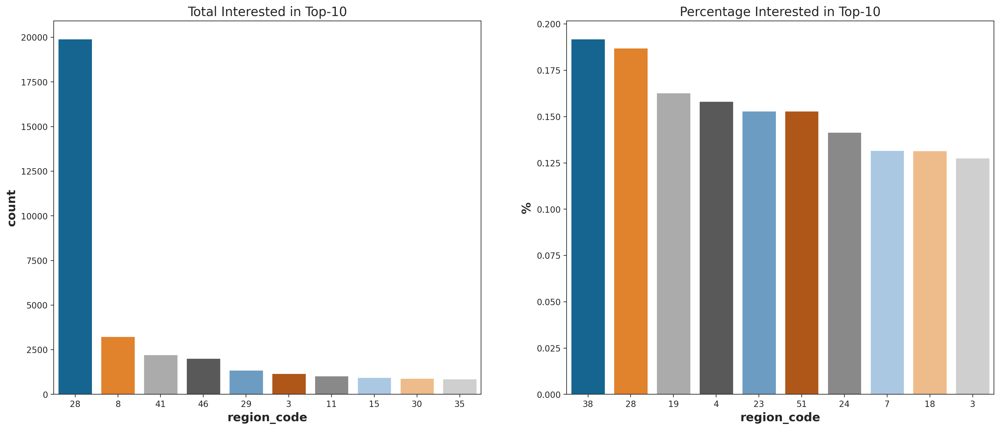

In [232]:
# top k region
k=10

df_aux1 = df4.groupby('region_code')['response'].sum().sort_values(ascending=False).reset_index() # total
df_aux2 = df4.groupby('region_code')['response'].mean().sort_values(ascending=False).reset_index() # percentage
df_aux = pd.merge(df_aux1, df_aux2, on='region_code', how='inner') # merge 
df_aux.columns = ['region','total','percentage']

plt.figure(figsize=[20,8])

# Total Interested
plt.subplot(1,2,1)
sns.barplot(x='region_code', y='response', data=df_aux1.head(k), order=df_aux1.region_code.head(k));
plt.title(f'Total Interested in Top-{k}')
plt.ylabel('count')

# Percentage Interested
plt.subplot(1,2,2)
sns.barplot(x='region_code', y='response', data=df_aux2.head(k), order=df_aux2.region_code.head(k));
plt.title(f'Percentage Interested in Top-{k}')
plt.ylabel('%');

total_top_k = int(df_aux1.head(k).response.sum())
total_all = int(df_aux.total.sum())
percentage  = 100*total_top_k/total_all

print(f'Total de Interessados no Top-{k} regions: {total_top_k} ({np.round(percentage,2)}% do Total de Interessados)')
print(f'Total de Interessados: {total_all}')
df_aux.T

### 4.2.4 Hypothesis  Summary

In [233]:
tab =[['Hipoteses', 'Conclusao', 'Relevancia'],
      ['H1', 'Verdadeira', 'Alta'],  
      ['H2', 'Falsa', 'Alta'],  
      ['H3', 'Falsa', 'Baixa'],
      ['H4', 'Verdadeira', 'Alta'],
      ['H5', 'Falsa', 'Alta'],
      ['H6', 'Falsa', 'Média'],
      ['H7', 'Falsa', 'Baixa'],
      ['H8', 'Verdadeira', 'Média'],
      ['H9', 'Falsa', 'Média']
     ]  
print( tabulate( tab, headers='firstrow' ) )

Hipoteses    Conclusao    Relevancia
-----------  -----------  ------------
H1           Verdadeira   Alta
H2           Falsa        Alta
H3           Falsa        Baixa
H4           Verdadeira   Alta
H5           Falsa        Alta
H6           Falsa        Média
H7           Falsa        Baixa
H8           Verdadeira   Média
H9           Falsa        Média


# 5.0 Data Preparation

In [77]:
#security copy
df5 = df4.copy()

In [78]:
# Split dataset Training/Validation
X = df5.drop('response', axis=1)
y = df5['response'].copy()

x_train, x_val, y_train, y_val = ms.train_test_split(X, y, test_size=0.20, random_state=42)

df5 = pd.concat( [x_train, y_train], axis=1 )

In [79]:
print ('X-Train Dataset Number of Rows: {}'.format(df5.shape[0]))
print ('X-Train Dataset Number of Columns: {}'.format(df5.shape[1]))
print ('-----------------------------------')
print ('X-Validation Dataset Number of Rows: {}'.format(x_val.shape[0]))
print ('X-Validation Dataset Number of Columns: {}'.format(x_val.shape[1]+1))

X-Train Dataset Number of Rows: 304887
X-Train Dataset Number of Columns: 14
-----------------------------------
X-Validation Dataset Number of Rows: 76222
X-Validation Dataset Number of Columns: 14


## 5.1 Standardization

In [80]:
apremium_rs = pp.RobustScaler()
potential_rs = pp.RobustScaler()

# annual_premium
df5['annual_premium'] = apremium_rs.fit_transform( df5[['annual_premium']].values)

# potential
df5['potential'] = potential_rs.fit_transform( df5[['potential']].values)

## 5.2 Rescaling

In [81]:
age_mms = pp.MinMaxScaler()
vintage_mms = pp.MinMaxScaler()
historical_mms = pp.MinMaxScaler()

# age 
df5['age'] = age_mms.fit_transform( df5[['age']].values)

# vintage
df5['vintage'] = vintage_mms.fit_transform( df5[['vintage']].values)

# historical
df5['historical'] = historical_mms.fit_transform( df5[['historical']].values)

## 5.3 Encoding

In [82]:
# vehicle_damage, driving_license, previously_insured - already encoded!

In [83]:
# gender - Factorize Encoding
factor_gender, unique = pd.factorize(df5['gender'], sort=True)
df5.loc[:,'gender'] = factor_gender

# vehicle_age - Factorize Encoding
factor_vehicle_age, unique = pd.factorize(df5['vehicle_age'], sort=True)
df5.loc[:,'vehicle_age'] = factor_vehicle_age

# region_code - Target Encoding
target_region_code = df5.groupby('region_code')['response'].mean()
df5.loc[:,'region_code'] = df5['region_code'].map(target_region_code)

# policy_sales_channel - Frequency Encoding
frequency_policy_sales_channel = df5.groupby('policy_sales_channel').size()/len(df5)
df5.loc[:,'policy_sales_channel'] = df5['policy_sales_channel'].map(frequency_policy_sales_channel)

## 5.4 Validation Preparation

In [84]:
# annual_premium - Robust Scaler
x_val.loc[:,'annual_premium'] = apremium_rs.transform( x_val[['annual_premium']].values)

# potential - Robust Scaler
x_val.loc[:,'potential'] = potential_rs.transform( x_val[['potential']].values)

# age - MinMax Scaler 
x_val.loc[:,'age'] = age_mms.transform( x_val[['age']].values)

# vintage - MinMax Scaler
x_val.loc[:,'vintage'] = vintage_mms.transform( x_val[['vintage']].values)

# historical - MinMax Scaler
x_val.loc[:,'historical'] = historical_mms.transform( x_val[['historical']].values)

# gender - Factorize Encoding
factor_gender, unique = pd.factorize(x_val.loc[:,'gender'], sort=True)
x_val.loc[:,'gender'] = factor_gender

# vehicle_age - Factorize Encoding
factor_vehicle_age, unique = pd.factorize(x_val.loc[:,'vehicle_age'], sort=True)
x_val.loc[:,'vehicle_age'] = factor_vehicle_age

# region_code - Target Encoding
x_val.loc[:,'region_code'] = x_val.loc[:,'region_code'].map(target_region_code)

# policy_sales_channel - Frequency Encoding
x_val.loc[:,'policy_sales_channel'] = x_val.loc[:,'policy_sales_channel'].map(frequency_policy_sales_channel)

# fillna
x_val = x_val.fillna(0)

## 5.5 Resampling

In [85]:
print('Before Resampling')
y_train.value_counts()

Before Resampling


0    267700
1     37187
Name: response, dtype: int64

In [86]:
#resample
x_train_res, y_train_res = SMOTETomek(random_state = 42).fit_resample(df5.iloc[:,:-1], y_train)

print('After resampling')
y_train_res.value_counts()

After resampling


1    243218
0    243218
Name: response, dtype: int64

# 6.0 Feature Selection

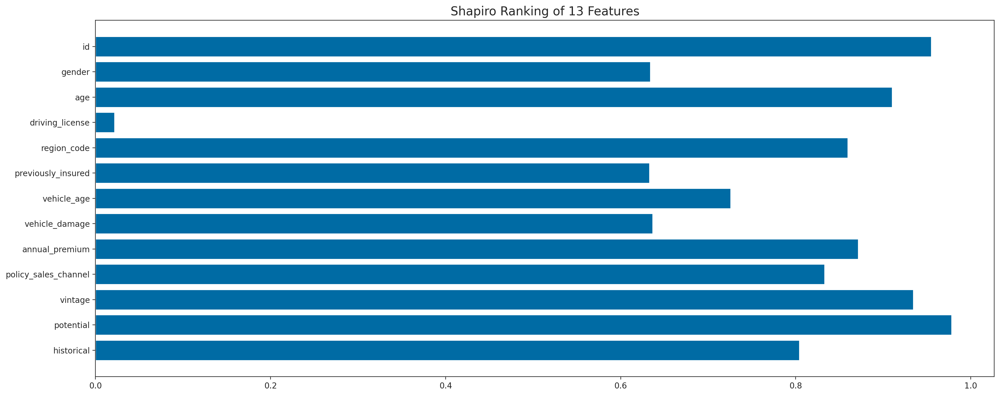

In [78]:
visualizer = Rank1D(algorithm='shapiro')

visualizer.fit(x_train, y_train)           
visualizer.transform(df5.iloc[:,:-1])        
visualizer.show(); 

## 6.1 Features Importance

In [79]:
# data preparation
x_train_n = df5.drop(['id','response'], axis=1)
y_train_n = y_train.values

In [80]:
# model definition
forest_model = en.ExtraTreesClassifier( n_estimators=250, random_state=42, n_jobs=-1)

# model training
forest_model.fit(x_train_n, y_train_n)

ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=42)

	Feature Ranking:


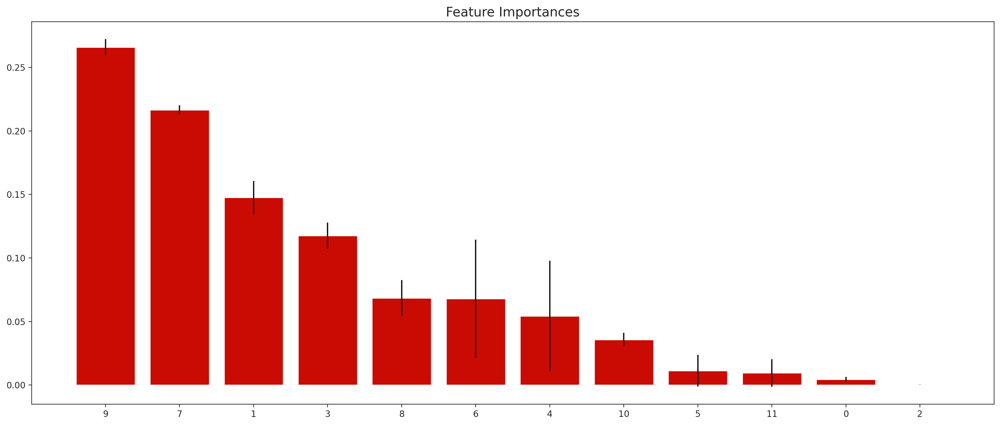

indice,9,7,1,3,8,6,4,10,5,11,0,2
Feature,vintage,annual_premium,age,region_code,policy_sales_channel,vehicle_damage,previously_insured,potential,vehicle_age,historical,gender,driving_license
Importance,0.266,0.217,0.148,0.118,0.068,0.068,0.054,0.036,0.011,0.010,0.004,0.000


In [141]:
# importances
importances = forest_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_model.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# create feature ranking
print("\tFeature Ranking:")
df = pd.DataFrame()
for i, j in zip( x_train_n, forest_model.feature_importances_ ):
    aux = pd.DataFrame( {'Feature':i, 'Importance':j}, index=[0] )
    df = pd.concat( [df, aux], axis=0 )
df = df.sort_values( 'Importance', ascending=False )
df['indice'] = indices.tolist()
df = df.set_index('indice')

# plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature Importances")
plt.bar(range(x_train_n.shape[1]), importances[indices], color='r', yerr=std[indices], align='center')
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

# print ranking
df.T

# 7.0 Machine Learning Modeling

In [87]:
seed = 42

In [88]:
# selected features by tree importances
cols_selected = ['vintage','annual_premium','age','region_code','vehicle_damage',
                 'policy_sales_channel','previously_insured','potential']

x_train = df5[cols_selected]
x_validation = x_val[cols_selected]
y_validation = y_val.copy()

## 7.1 KNN

In [89]:
# model definition
knn_model = nb.KNeighborsClassifier(n_neighbors=8)

# model training
knn_model.fit(x_train, y_train)

# model prediction - generalization
yhat_knn = knn_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(knn_model, open('../src/models/knn_model.pkl', 'wb'))
pkl.dump(yhat_knn, open('../src/models/yhat_knn.pkl', 'wb'))

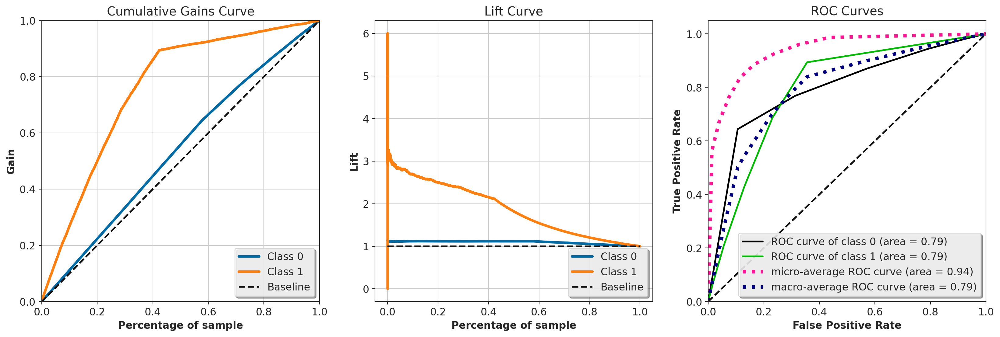

In [90]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_knn, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_knn, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_knn, ax = axs[2]);

## 7.2 Logistic Regression

In [91]:
# model definition
lr_model = lm.LogisticRegression(random_state=seed)

# model training
lr_model.fit(x_train, y_train)

# model prediction - generalization
yhat_lr = lr_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(lr_model, open('../src/models/lr_model.pkl', 'wb'))
pkl.dump(yhat_lr, open('../src/models/yhat_lr.pkl', 'wb'))

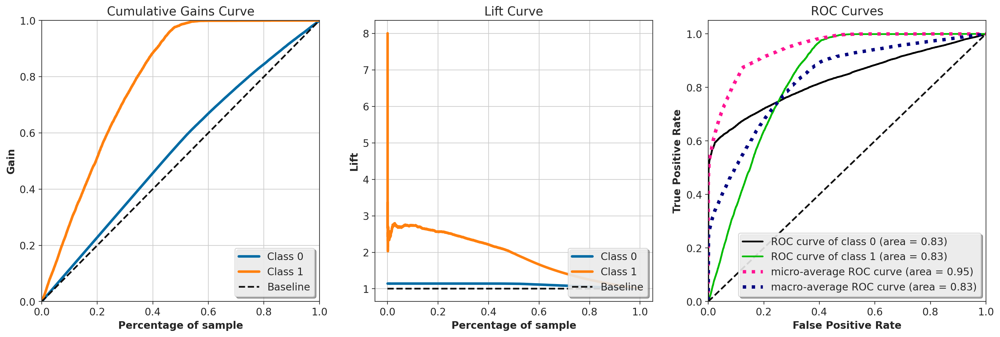

In [92]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_lr, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_lr, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_lr, ax = axs[2]);

## 7.3 Extra Trees

In [117]:
# model definition
et_model = en.ExtraTreesClassifier( n_estimators=300, random_state=seed, n_jobs=-1)

# model training
et_model.fit(x_train, y_train)

# model prediction - generalization
yhat_et = et_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(et_model, open('../src/models/et_model.pkl', 'wb'))
pkl.dump(yhat_et, open('../src/models/yhat_et.pkl', 'wb'))

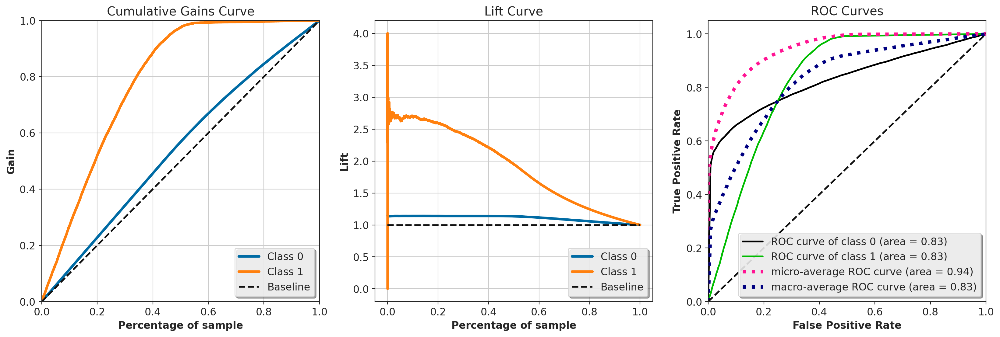

In [118]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_et, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_et, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_et, ax = axs[2]);

## 7.4 Random Forest

In [119]:
# model definition
rf_model = RandomForestClassifier( n_estimators=300, random_state=seed, n_jobs=-1)

# model training
rf_model.fit(x_train, y_train)

# model prediction - generalization
yhat_rf = rf_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(rf_model, open('../src/models/rf_model.pkl', 'wb'))
pkl.dump(yhat_rf, open('../src/models/yhat_rf.pkl', 'wb'))

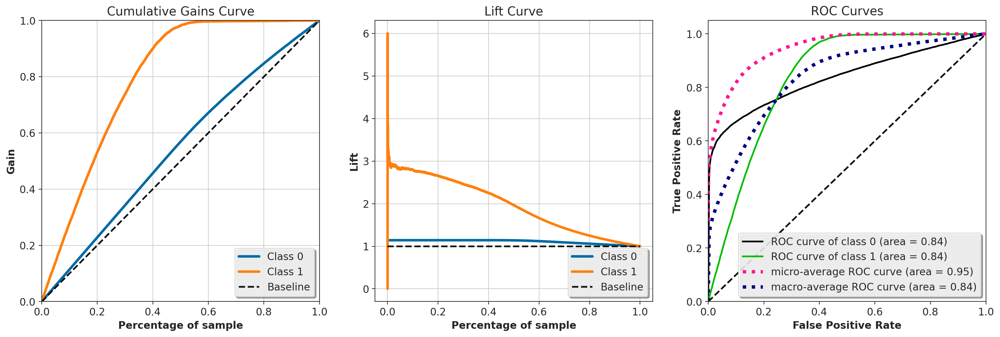

In [120]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_rf, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_rf, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_rf, ax = axs[2]);

## 7.5 Naive Bayes

In [93]:
# model definition
nb_model = GaussianNB()

# model training
nb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_nb = nb_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(nb_model, open('../src/models/nb_model.pkl', 'wb'))
pkl.dump(yhat_nb, open('../src/models/yhat_nb.pkl', 'wb'))

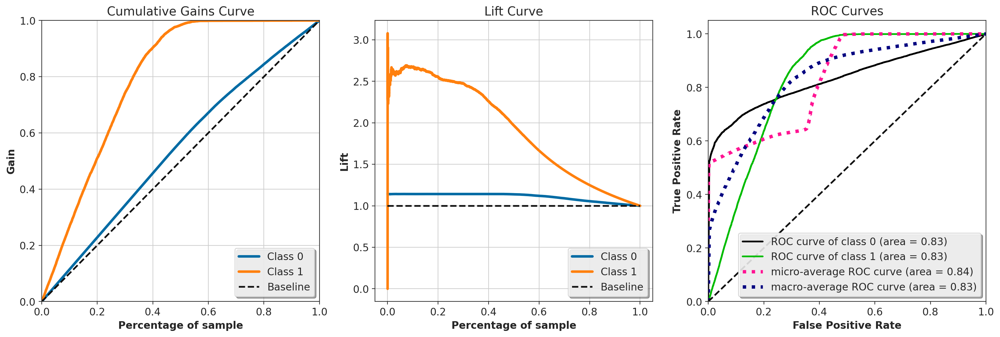

In [94]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_nb, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_nb, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_nb, ax = axs[2]);

## 7.6 XGBoost

In [95]:
# model definition
xgb_model = XGBClassifier(objective = 'binary:logistic', eval_metric = 'error')

# model training
xgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_xgb = xgb_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(xgb_model, open('../src/models/xgb_model.pkl', 'wb'))
pkl.dump(yhat_xgb, open('../src/models/yhat_xgb.pkl', 'wb'))

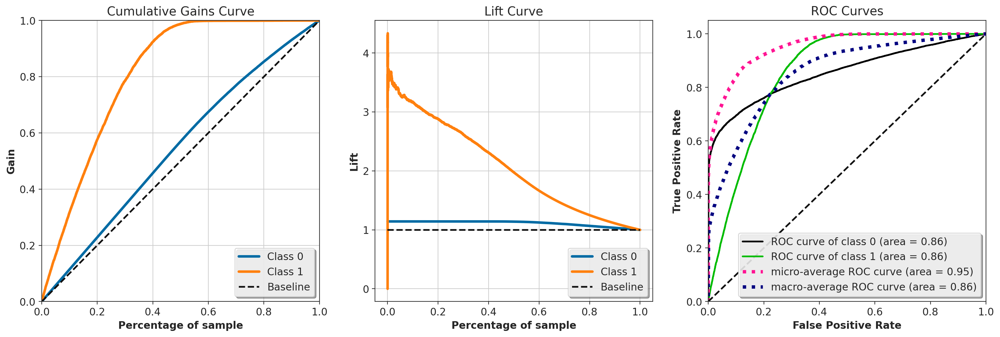

In [96]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_xgb, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_xgb, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_xgb, ax = axs[2]);

## 7.7 Light Gradient Boosted Machine

In [97]:
# model definition
lgbm_model = LGBMClassifier( random_state=seed, n_jobs=-1 )

# model training
lgbm_model.fit(x_train, y_train)

# model prediction - generalization
yhat_lgbm = lgbm_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(lgbm_model, open('../src/models/lgbm_model.pkl', 'wb'))
pkl.dump(yhat_lgbm, open('../src/models/yhat_lgbm.pkl', 'wb'))

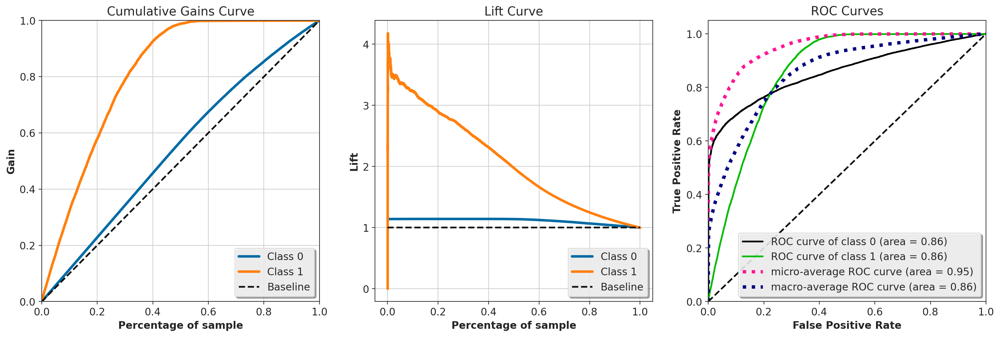

In [98]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_lgbm, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_lgbm, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_lgbm, ax = axs[2]);

## 7.8 Histogram-Based Gradient Boosting

In [99]:
# model definition
hgb_model = en.HistGradientBoostingClassifier( random_state=seed )

# model training
hgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_hgb = hgb_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(hgb_model, open('../src/models/hgb_model.pkl', 'wb'))
pkl.dump(yhat_hgb, open('../src/models/yhat_hgb.pkl', 'wb'))

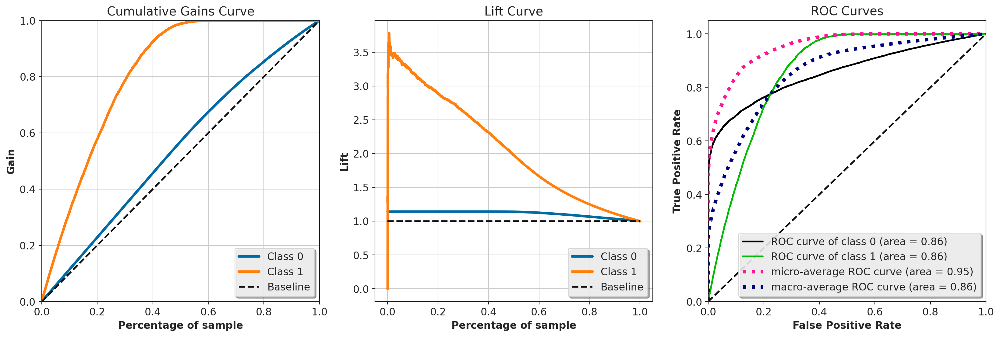

In [100]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_hgb, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_hgb, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_hgb, ax = axs[2]);

## 7.9 Gradient Boosting Classifier

In [101]:
# model definition
gbc_model = en.GradientBoostingClassifier( random_state=seed )

# model training
gbc_model.fit(x_train, y_train)

# model prediction - generalization
yhat_gbc = gbc_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(gbc_model, open('../src/models/gbc_model.pkl', 'wb'))
pkl.dump(yhat_gbc, open('../src/models/yhat_gbc.pkl', 'wb'))

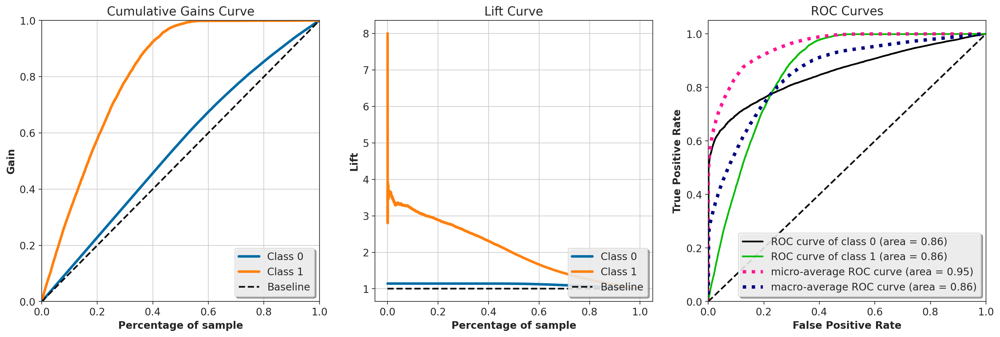

In [102]:
# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_gbc, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_gbc, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_gbc, ax = axs[2]);

## 7.10 Calibrated Classifier

In [105]:
# model definition
base_model = [en.HistGradientBoostingClassifier( random_state=seed ),
              LGBMClassifier( random_state=seed, n_jobs=-1 )]
clb_model = CalibratedClassifierCV(base_estimator=base_model[1], cv=5)

# model training
clb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_clb = clb_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(clb_model, open('../src/models/clb_model.pkl', 'wb'))
pkl.dump(yhat_clb, open('../src/models/yhat_clb.pkl', 'wb'))

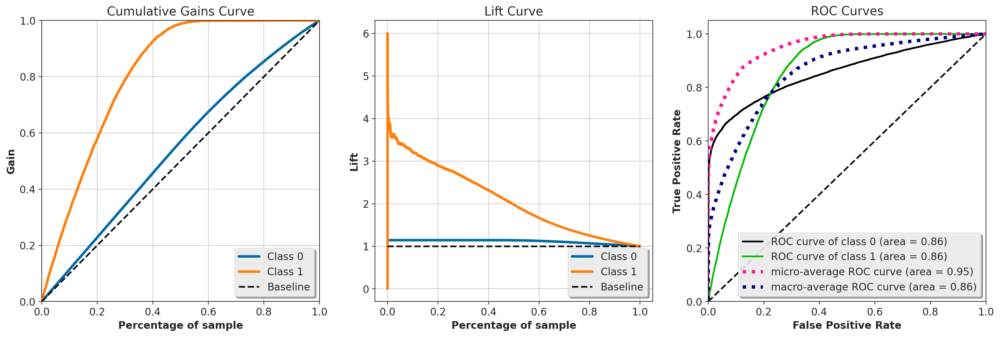

In [104]:
#0# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_clb, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_clb, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_clb, ax = axs[2]); 

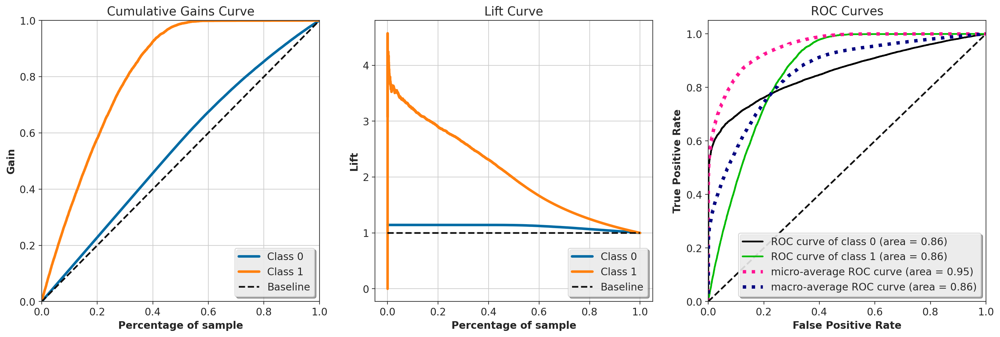

In [106]:
#1# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_clb, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_clb, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_clb, ax = axs[2]);

## 7.11 Bagging Classifier

In [107]:
# model definition
base_model = [en.HistGradientBoostingClassifier( random_state=seed ),
              LGBMClassifier( random_state=seed, n_jobs=-1 )]
bag_model = en.BaggingClassifier( base_estimator=base_model[1], random_state=seed )

# model training
bag_model.fit(x_train, y_train)

# model prediction - generalization
yhat_bag = bag_model.predict_proba(x_validation)

# save model, yhat_model
pkl.dump(bag_model, open('../src/models/bag_model.pkl', 'wb'))
pkl.dump(yhat_bag, open('../src/models/yhat_bag.pkl', 'wb'))

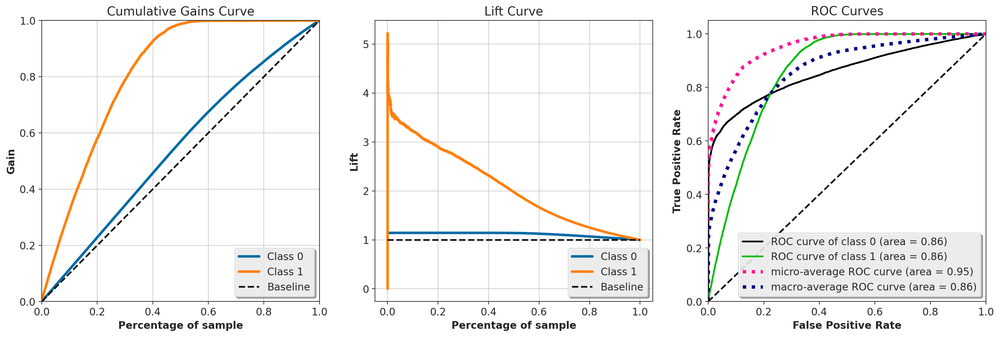

In [182]:
#0# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_bag, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_bag, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_bag, ax = axs[2]);

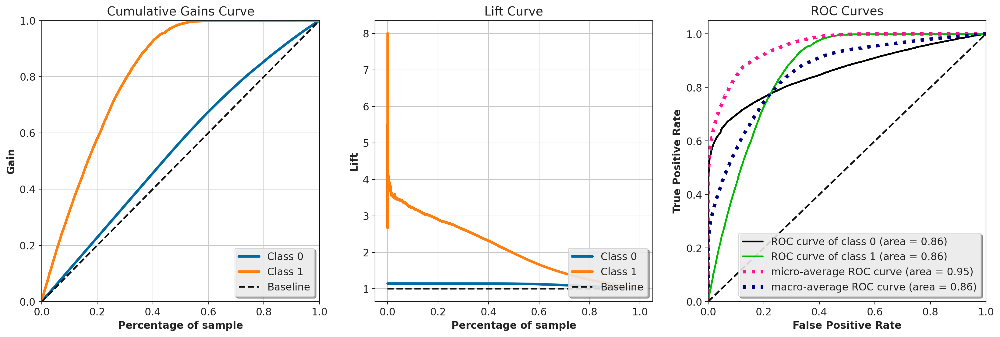

In [108]:
#1# Acumulative Gain | Lift Curve | ROC Curves
fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
skplt.metrics.plot_cumulative_gain( y_validation, yhat_bag, ax = axs[0])
skplt.metrics.plot_lift_curve( y_validation, yhat_bag, ax = axs[1]);
skplt.metrics.plot_roc(y_validation, yhat_bag, ax = axs[2]);

## Cross Validation (Unbalanced Dataset)

In [43]:
k=20000

In [122]:
##compute cross validation metrics for all models
#knn_cv_results = cross_validation(knn_model, x_train, y_train, 5, df5, k=k)
#lr_cv_results  = cross_validation(lr_model,  x_train, y_train, 5, df5, k=k)
#et_cv_results  = cross_validation(et_model,  x_train, y_train, 5, df5, k=k)
#rf_cv_results  = cross_validation(rf_model,  x_train, y_train, 5, df5, k=k)
#nb_cv_results  = cross_validation(nb_model,  x_train, y_train, 5, df5, k=k)
#xgb_cv_results = cross_validation(xgb_model, x_train, y_train, 5, df5, k=k)
#lgbm_cv_results = cross_validation(lgbm_model, x_train, y_train, 5, df5, k=k)
#hgb_cv_results = cross_validation(hgb_model, x_train, y_train, 5, df5, k=k)
#gbc_cv_results = cross_validation(gbc_model, x_train, y_train, 5, df5, k=k)
#clb_cv_results = cross_validation(clb_model, x_train, y_train, 5, df5, k=k)
#bag_cv_results = cross_validation(bag_model, x_train, y_train, 5, df5, k=k)

In [123]:
##save cv results for all models
#pkl.dump(knn_cv_results, open('../src/models/knn_cv_results.pkl', 'wb'))
#pkl.dump(lr_cv_results, open('../src/models/lr_cv_results.pkl', 'wb'))
#pkl.dump(et_cv_results, open('../src/models/et_cv_results.pkl', 'wb'))
#pkl.dump(rf_cv_results, open('../src/models/rf_cv_results.pkl', 'wb'))
#pkl.dump(nb_cv_results, open('../src/models/nb_cv_results.pkl', 'wb'))
#pkl.dump(xgb_cv_results, open('../src/models/xgb_cv_results.pkl', 'wb'))
#pkl.dump(lgbm_cv_results, open('../src/models/lgbm_cv_results.pkl', 'wb'))
#pkl.dump(hgb_cv_results, open('../src/models/hgb_cv_results.pkl', 'wb'))
#pkl.dump(gbc_cv_results, open('../src/models/gbc_cv_results.pkl', 'wb'))
#pkl.dump(clb_cv_results, open('../src/models/clb_cv_results.pkl', 'wb'))
#pkl.dump(bag_cv_results, open('../src/models/bag_cv_results.pkl', 'wb'))

In [45]:
##load cv results for all models
# knn_cv_results = pkl.load( open('../src/models/knn_cv_results.pkl', 'rb') )
# lr_cv_results = pkl.load( open('../src/models/lr_cv_results.pkl', 'rb') ) 
# et_cv_results = pkl.load( open('../src/models/et_cv_results.pkl', 'rb') ) 
# rf_cv_results = pkl.load( open('../src/models/rf_cv_results.pkl', 'rb') ) 
# nb_cv_results = pkl.load( open('../src/models/nb_cv_results.pkl', 'rb') ) 
# xgb_cv_results = pkl.load( open('../src/models/xgb_cv_results.pkl', 'rb') )
# lgbm_cv_results = pkl.load( open('../src/models/lgbm_cv_results.pkl', 'rb') )
# hgb_cv_results = pkl.load( open('../src/models/hgb_cv_results.pkl', 'rb') )
# gbc_cv_results = pkl.load( open('../src/models/gbc_cv_results.pkl', 'rb') )
# clb_cv_results = pkl.load( open('../src/models/clb_cv_results.pkl', 'rb') )
# bag_cv_results = pkl.load( open('../src/models/bag_cv_results.pkl', 'rb') )

In [124]:
# # concat all results
all_cv_results = pd.concat([knn_cv_results,lr_cv_results,et_cv_results,rf_cv_results,nb_cv_results,
           xgb_cv_results,lgbm_cv_results,hgb_cv_results,gbc_cv_results,clb_cv_results,bag_cv_results],axis=0)
pkl.dump(all_cv_results, open('../src/models/all_cv_results.pkl', 'wb'))

In [125]:
cv_results = pkl.load(open('../src/models/all_cv_results.pkl', 'rb'))
cv_results

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,KNeighborsClassifier,0.335,0.009,0.068,0.002,0.870,0.276,0.001,0.742,0.002
0,LogisticRegression,0.000,0.000,0.000,0.000,0.878,0.287,0.002,0.773,0.006
0,ExtraTreesClassifier,0.339,0.007,0.136,0.003,0.862,0.288,0.002,0.773,0.005
0,RandomForestClassifier,0.358,0.009,0.110,0.003,0.867,0.292,0.002,0.784,0.005
0,GaussianNB,0.251,0.001,0.973,0.001,0.643,0.296,0.001,0.796,0.002
0,XGBClassifier,0.407,0.025,0.015,0.002,0.877,0.307,0.001,0.825,0.003
0,LGBMClassifier,0.091,0.071,0.000,0.000,0.878,0.308,0.002,0.828,0.004
0,HistGradientBoostingClassifier,0.072,0.091,0.000,0.000,0.878,0.308,0.002,0.827,0.005
0,GradientBoostingClassifier,0.086,0.171,0.000,0.000,0.878,0.307,0.001,0.826,0.004
0,CalibratedClassifierCV,0.435,0.006,0.080,0.002,0.875,0.308,0.001,0.827,0.004


# 8.0 Model Performance

In [126]:
# copy data
df8 = x_validation.copy()
df8['response'] = y_validation.copy()

In [98]:
# load models, yhat
# models_trained
# knn_model_trained = pkl.load(open('../src/models/knn_model.pkl', 'rb'))
# lr_model_trained  = pkl.load(open('../src/models/lr_model.pkl', 'rb'))
# et_model_trained  = pkl.load(open('../src/models/et_model.pkl', 'rb'))
# rf_model_trained  = pkl.load(open('../src/models/rf_model.pkl', 'rb'))
# nb_model_trained  = pkl.load(open('../src/models/nb_model.pkl', 'rb'))
# xgb_model_trained = pkl.load(open('../src/models/xgb_model.pkl', 'rb'))
# lgbm_model_trained = pkl.load(open('../src/models/lgbm_model.pkl', 'rb'))
# hgb_model_trained = pkl.load(open('../src/models/hgb_model.pkl', 'rb'))
# gbc_model_trained = pkl.load(open('../src/models/gbc_model.pkl', 'rb'))
# clb_model_trained = pkl.load(open('../src/models/clb_model.pkl', 'rb'))
# bag_model_trained = pkl.load(open('../src/models/bag_model.pkl', 'rb'))

# yhat_models
# yhat_knn = pkl.load(open('../src/models/yhat_knn.pkl', 'rb'))
# yhat_lr  = pkl.load(open('../src/models/yhat_lr.pkl', 'rb'))
# yhat_et  = pkl.load(open('../src/models/yhat_et.pkl', 'rb'))
# yhat_rf  = pkl.load(open('../src/models/yhat_rf.pkl', 'rb'))
# yhat_nb  = pkl.load(open('../src/models/yhat_nb.pkl', 'rb'))
# yhat_xgb = pkl.load(open('../src/models/yhat_xgb.pkl', 'rb'))
# yhat_lgbm = pkl.load(open('../src/models/yhat_lgbm.pkl', 'rb'))
# yhat_hgb = pkl.load(open('../src/models/yhat_hgb.pkl', 'rb'))
# yhat_gbc = pkl.load(open('../src/models/yhat_gbc.pkl', 'rb'))
# yhat_clb = pkl.load(open('../src/models/yhat_clb.pkl', 'rb'))
# yhat_bag = pkl.load(open('../src/models/yhat_bag.pkl', 'rb'))

In [128]:
k = 20000
model = ['KNN','Logistic Regression','Extra Trees','Random Forest','Naive Bayes',
         'XGBoost','LightGBM','HistogramGB','GBClassifier','Calibrated','Bagging']
yhat = [yhat_knn,yhat_lr,yhat_et,yhat_rf,yhat_nb,yhat_xgb,yhat_lgbm,yhat_hgb,yhat_gbc,yhat_clb,yhat_bag]

for i in range(len(model)):
    # compute precision at k
    precision = precision_at_k_model(df8, yhat[i], k)

    # compute recall at k
    recall = recall_at_k_model(df8, yhat[i], k)

    print(f'For {model[i]} model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For KNN model:
Precision at K(20000) = 30.19%
Recall at K(20000) = 63.40%

For Logistic Regression model:
Precision at K(20000) = 31.03%
Recall at K(20000) = 65.17%

For Extra Trees model:
Precision at K(20000) = 31.01%
Recall at K(20000) = 65.13%

For Random Forest model:
Precision at K(20000) = 31.70%
Recall at K(20000) = 66.58%

For Naive Bayes model:
Precision at K(20000) = 31.20%
Recall at K(20000) = 65.54%

For XGBoost model:
Precision at K(20000) = 34.04%
Recall at K(20000) = 71.49%

For LightGBM model:
Precision at K(20000) = 34.36%
Recall at K(20000) = 72.16%

For HistogramGB model:
Precision at K(20000) = 34.25%
Recall at K(20000) = 71.93%

For GBClassifier model:
Precision at K(20000) = 34.09%
Recall at K(20000) = 71.61%

For Calibrated model:
Precision at K(20000) = 34.14%
Recall at K(20000) = 71.71%

For Bagging model:
Precision at K(20000) = 34.34%
Recall at K(20000) = 72.11%

